In [1]:
from astropy.io import fits
import os
from sklearn import preprocessing
import shutil
from astropy.timeseries import LombScargle
import numpy as np
import matplotlib.pyplot as plt
from PyAstronomy import pyasl
from specutils.manipulation import FluxConservingResampler, LinearInterpolatedResampler, SplineInterpolatedResampler
from astropy import units as u
from specutils import Spectrum1D
from lmfit import Parameters, minimize, report_fit, Model,fit_report
from pylab import rc
from matplotlib import transforms
from astropy.time import Time
from astropy.coordinates import SkyCoord, EarthLocation
from astropy.coordinates import ICRS
from astropy import units as u
from specutils import Spectrum1D
from specutils.manipulation import FluxConservingResampler
plt.rc('xtick',c='w')
plt.rc('ytick',c='w')

/home/nwal/anaconda3/lib/python3.7/site-packages/pyfits/__init__.py:22: PyFITSDeprecationWarning: PyFITS is deprecated, please use astropy.io.fits
  PyFITSDeprecationWarning)  # noqa


In [2]:
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx

In [3]:
from __future__ import print_function, division
import scipy.interpolate as sci
import numpy as np
from PyAstronomy.pyaC import pyaErrors as PE
import six.moves as smo


def dopplerShift(wvl, flux, v, edgeHandling=None, fillValue=None, vlim=0.05):
    """
    Returns
    -------
    nflux : array
        The shifted flux array at the *old* input locations.
    wlprime : array
        The shifted wavelength axis.
    """
    # Order check
    if np.any(np.diff(wvl) < 0.0):
        raise(PE.PyAValError("Wavelength axis must be sorted in ascending order.", \
                             solution="Use sorted axis.")) 
        
    # Speed of light [km/s]
    cvel = 299792.458
    
    if np.abs(v) > vlim*cvel:
        raise(PE.PyAValError("Specified velocity of % g km/s exceeds %g %% of the speed of light. No relativistic effects are considered in this implementation." % (v, vlim*100.), \
                             where="dopplerShift", \
                             solution="Increase 'vlim' if you wish to suppress this error."))
    
    # Shifted wavelength axis
    wlprime = wvl * (1.0 + v / cvel)

    # Overlap check
    if (wlprime[0] >= wvl[-1]) or (wlprime[-1] <= wvl[0]):
        raise(PE.PyAValError("The shifted wavelength axis shows no overlap with the input axis. The velocity shift of %g km/s is too large." % v, \
                             where="dopplerShift", \
                             solution=["Use smaller shifts", "Please consider another implementation. Also note that the treatment here is not relativistic."]))

    fv = np.nan
    if edgeHandling == "fillValue":
        if fillValue is None:
            raise(PE.PyAValError("Fill value not specified", where="pyasl.dopplerShift",
                                 solution="If you request 'fillValue' as edge handling method, you need to specify the 'fillValue' keyword."))
        fv = fillValue

    f = sci.interp1d(wlprime, flux, bounds_error=False, fill_value=fv)
    nflux = f(wvl)

    if edgeHandling == "firstlast":
        # Not is-NaN
        nin = ~np.isnan(nflux)
        if not nin[0]:
            # First element in invalid (NaN)
            # Find index of first valid (not NaN) element
            fvindex = np.argmax(nin)
            # Replace leading elements
            nflux[0:fvindex] = nflux[fvindex]
        if not nin[-1]:
            # Last element is invalid
            # Index of last valid element
            lvindex = -np.argmax(nin[::-1])-1
            # Replace trailing elements
            nflux[lvindex+1:] = nflux[lvindex]

    return nflux, wlprime


In [4]:
#graces MG
path = '/home/nwal/Desktop/PG0010/gracesReSub/comb/'
fluxes = []
wavels = []
count = 0
with open(path+'MgOrder') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        fluxes.append(flx)
        wavels.append(wvl)
        count = count+1
        
path = '/home/nwal/Desktop/toEmail/20/'
dates2 = []
with open(path+'utcs') as file:
    for line in file:
        line = line.strip('\n')
        line = Time(line)
        dates2.append(line.mjd)
print(dates2)

[58797.24431347222, 58797.26672112269, 58797.28909356482, 58798.25334054398, 58798.27578582176, 58798.29820037037, 58799.21763303241, 58799.23961329861, 58799.261685590274, 58799.42143079861, 58799.4439324537, 58799.46640207176]


[-14.773235388874875, -14.833861894527576, -14.89623046337069, -15.201194943442786, -15.262928419258516, -15.325863198320945, -15.507377906183553, -15.56399090921861, -15.623584829569795, -16.044651097935894, -16.089961067182113, -16.12912706501529]


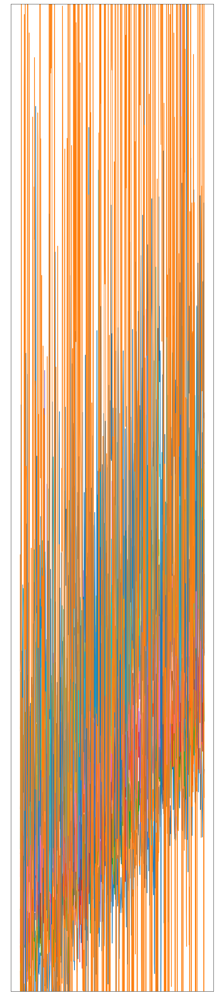

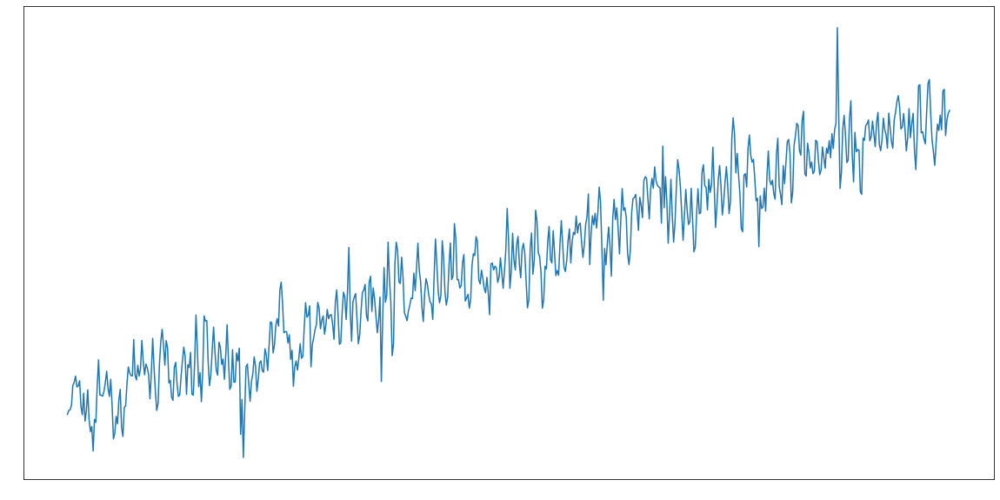

In [5]:
esovlt = EarthLocation.from_geodetic(lat=19.8238*u.deg, lon=-155.4689*u.deg, height=4213*u.m)
sc = SkyCoord("00:13:21.0725724609 +28:20:19.825834604", frame=ICRS, unit=(u.hourangle, u.deg))
baryCorr = []
for el in dates2:
    barycorr = sc.radial_velocity_correction(obstime=Time(el, format='mjd'), location=esovlt)  
    baryCorr.append(barycorr.to(u.km/u.s).value)
    
print(baryCorr)
adjFlux = []
adjWvl = []

for count, value in enumerate(wavels):
    newF, newW = dopplerShift(value, fluxes[count],baryCorr[count],edgeHandling='fillValue',fillValue=1)
    adjFlux.append(newF)
    adjWvl.append(newW)
    
fluxAdj = []
for count, value in enumerate(wavels):
    input_spectra = Spectrum1D(flux=adjFlux[count]* u.mJy,spectral_axis=value*u.Angstrom)
    resample_grid = wavels[0][1145:-2810]*u.Angstrom
    fluxc_resample = FluxConservingResampler()
    output_spectrum1D = fluxc_resample(input_spectra, resample_grid)
    fluxAdj.append(np.nan_to_num(output_spectrum1D.flux, copy=False, nan=0.0))

    
plt.figure(figsize=(10,50))
fluxAdjWeighted = []
cummulative = np.zeros_like(fluxAdj[0])
cummulative = cummulative.value
cc = 0
for el in fluxAdj:
    plt.plot(resample_grid, el/np.median(el)+cc*0.1)
    plt.ylim(0.6,4.)
    stedies = 1/np.std(el/np.median(el))
    fluxAdjWeighted.append(stedies*el/np.median(el))
    cummulative = cummulative+stedies*el.value/np.median(el.value)
    cc = cc + 1
    #plt.show()
plt.show()
plt.figure(figsize=(20,10))
plt.plot(resample_grid, cummulative)

In [6]:
resample_gridGraces = resample_grid
cummulativeGraces = cummulative

In [7]:
#uves MG
path = '/home/nwal/Desktop/PG0010/PG0010Reflex/comb/'
fluxes = []
wavels = []
count = 0
with open(path+'blues') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        fluxes.append(flx)
        wavels.append(wvl)
        count = count+1
        
path = '/home/nwal/Desktop/PG0010/PG0010Reflex/comb/log/'
dates2 = []
with open(path+'combs') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()
print(dates2)

[58048.087231362, 58048.095396827, 58049.059279581, 58049.06745199, 58072.022561301, 58072.030731163, 58075.020719284, 58075.028889355]


[-6.756516397364842, -6.77909364226776, -7.14517772002619, -7.166972865612993, -16.901309365321726, -16.92326996555835, -18.031868401471787, -18.0538182950575]


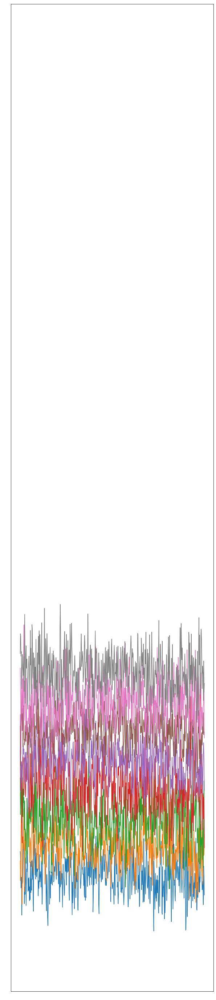

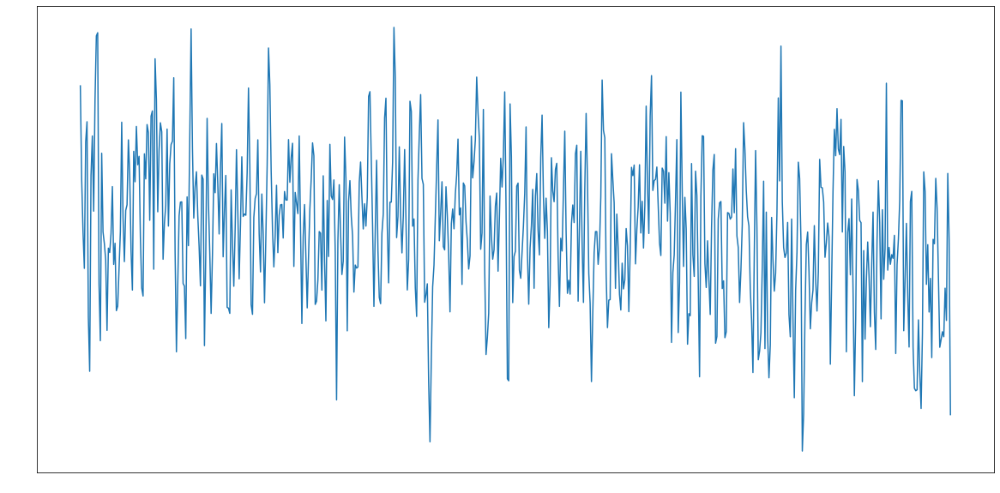

In [8]:
esovlt = EarthLocation.from_geodetic(lat=-24.6275*u.deg, lon=-70.4044*u.deg, height=2635*u.m)
sc = SkyCoord("00:13:21.0725724609 +28:20:19.825834604", frame=ICRS, unit=(u.hourangle, u.deg))
baryCorr = []
for el in dates2:
    barycorr = sc.radial_velocity_correction(obstime=Time(el, format='mjd'), location=esovlt)  
    baryCorr.append(barycorr.to(u.km/u.s).value)
    
print(baryCorr)
adjFlux = []
adjWvl = []

for count, value in enumerate(wavels):
    newF, newW = dopplerShift(value, fluxes[count],baryCorr[count],edgeHandling='fillValue',fillValue=1)
    adjFlux.append(newF)
    adjWvl.append(newW)
    
fluxAdj = []
for count, value in enumerate(wavels):
    input_spectra = Spectrum1D(flux=adjFlux[count]* u.mJy,spectral_axis=value*u.Angstrom)
    resample_grid = resample_gridGraces
    fluxc_resample = FluxConservingResampler()
    output_spectrum1D = fluxc_resample(input_spectra, resample_grid)
    fluxAdj.append(np.nan_to_num(output_spectrum1D.flux, copy=False, nan=0.0))

    
plt.figure(figsize=(10,50))
fluxAdjWeighted = []
cummulative = np.zeros_like(fluxAdj[0])
cummulative = cummulative.value
cc = 0
for el in fluxAdj:
    plt.plot(resample_grid, el/np.median(el)+cc*0.1)
    plt.ylim(0.6,4.)
    stedies = 1/np.std(el/np.median(el))
    fluxAdjWeighted.append(stedies*el/np.median(el))
    cummulative = cummulative+stedies*el.value/np.median(el.value)
    cc = cc + 1
    #plt.show()
plt.show()
plt.figure(figsize=(20,10))
plt.plot(resample_grid, cummulative)

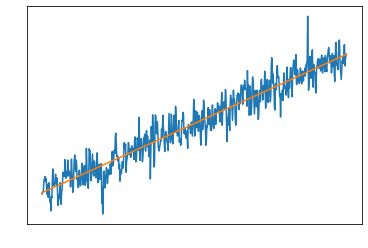

11.779597508479192
37.754979879061935


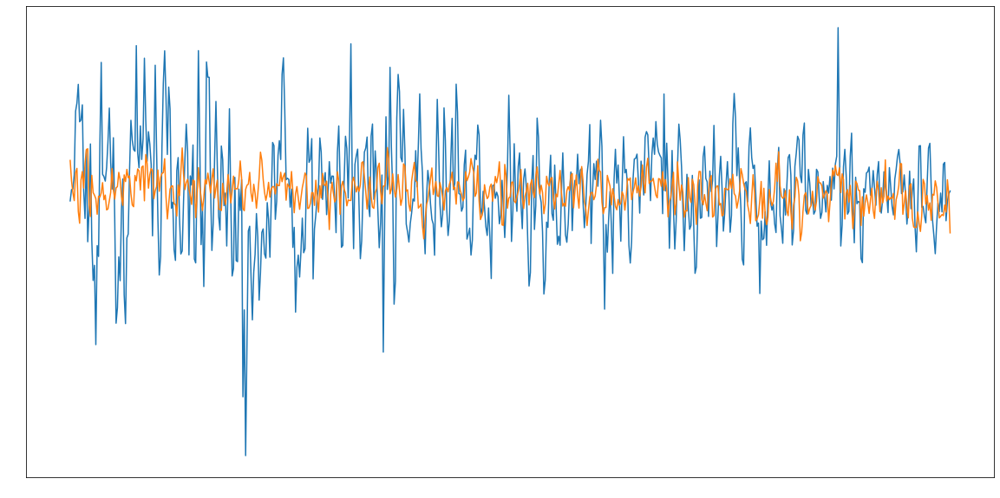

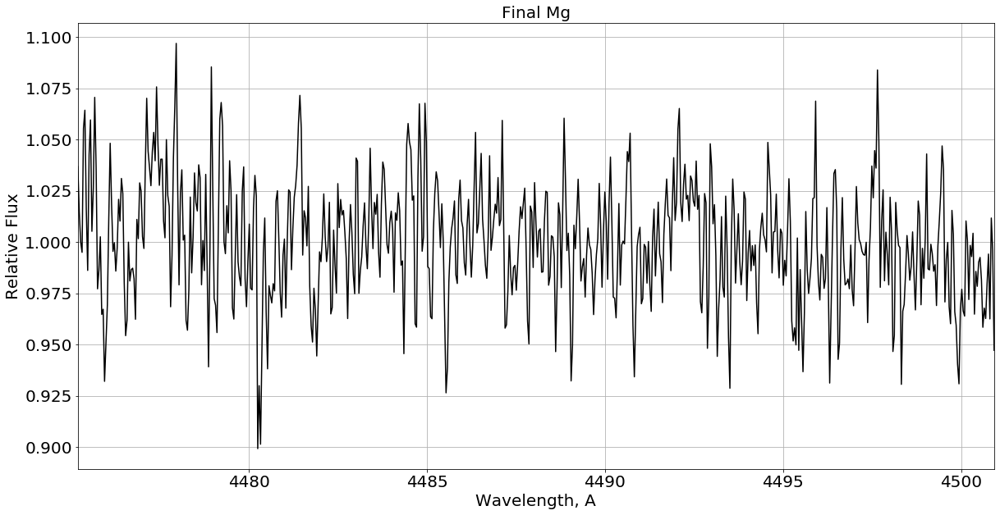

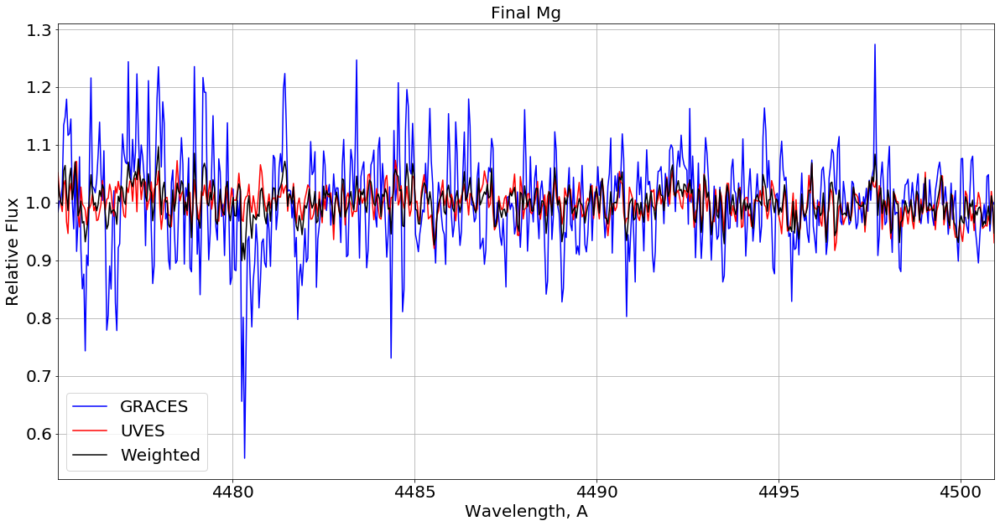

In [9]:
grad,offset = np.poly1d(np.polyfit(resample_gridGraces.value, cummulativeGraces.value, 1))
plt.plot(resample_gridGraces,cummulativeGraces)
plt.plot(resample_gridGraces, resample_gridGraces.value*grad+offset)

cummulativeGracesCorrected = cummulativeGraces.value/(resample_gridGraces.value*grad+offset)
plt.show()
plt.figure(figsize=(20,10))
plt.plot(resample_gridGraces,cummulativeGracesCorrected)
plt.plot(resample_grid, cummulative/np.median(cummulative))

print(1/np.std(cummulativeGracesCorrected))
print(1/np.std(cummulative/np.median(cummulative)))
final_flux = (11.133041945121683*cummulativeGracesCorrected)+37.3471798511208*(cummulative/np.median(cummulative))
final_flux = final_flux/np.median(final_flux)
plt.rc('xtick',c='k')
plt.rc('ytick',c='k')
plt.figure(figsize=(20,10))
plt.title('Final Mg',fontsize=20)
plt.plot(resample_grid,final_flux,c='k')
#plt.plot(resample_gridGraces,cummulativeGracesCorrected)
#plt.plot(resample_grid, cummulative/np.median(cummulative))
plt.xlim(resample_grid.value[0], resample_grid.value[-1])
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel('Wavelength, A',fontsize=20)
plt.ylabel('Relative Flux',fontsize=20)
plt.grid()
plt.savefig('PG0010_Mg_Master.pdf')
plt.show()



plt.figure(figsize=(20,10))
plt.title('Final Mg',fontsize=20)
plt.plot(resample_gridGraces,cummulativeGracesCorrected,c='b', label='GRACES')
plt.plot(resample_grid, cummulative/np.median(cummulative),c='r', label='UVES')
plt.plot(resample_grid,final_flux,c='k', label='Weighted')

plt.xlim(resample_grid.value[0], resample_grid.value[-1])
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel('Wavelength, A',fontsize=20)
plt.ylabel('Relative Flux',fontsize=20)
plt.legend(fontsize=20)
plt.grid()
plt.savefig('PG0010_Mg_MasterAll.pdf')
plt.show()


plt.rc('xtick',c='w')
plt.rc('ytick',c='w')

In [10]:
#graces Ca

#graces MG
path = '/home/nwal/Desktop/PG0010/gracesReSub/comb/'
fluxes = []
wavels = []
count = 0
with open(path+'CaIIOrder') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        fluxes.append(flx)
        wavels.append(wvl)
        count = count+1
        
path = '/home/nwal/Desktop/toEmail/20/'
dates2 = []
with open(path+'utcs') as file:
    for line in file:
        line = line.strip('\n')
        line = Time(line)
        dates2.append(line.mjd)
print(dates2)

[58797.24431347222, 58797.26672112269, 58797.28909356482, 58798.25334054398, 58798.27578582176, 58798.29820037037, 58799.21763303241, 58799.23961329861, 58799.261685590274, 58799.42143079861, 58799.4439324537, 58799.46640207176]


[-14.773235388874875, -14.833861894527576, -14.89623046337069, -15.201194943442786, -15.262928419258516, -15.325863198320945, -15.507377906183553, -15.56399090921861, -15.623584829569795, -16.044651097935894, -16.089961067182113, -16.12912706501529]


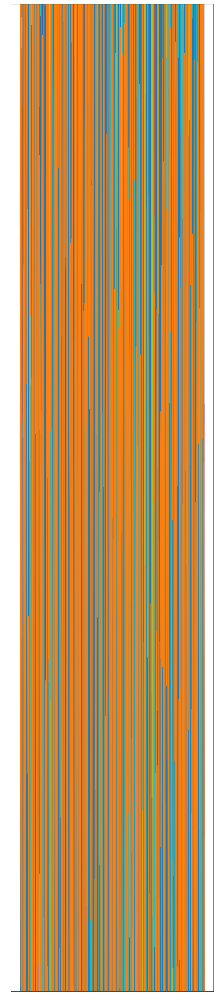

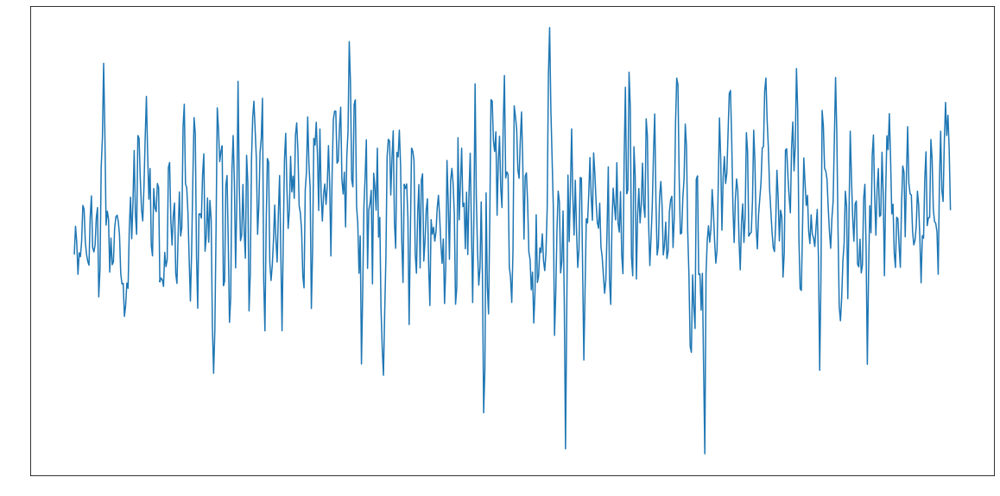

In [11]:
esovlt = EarthLocation.from_geodetic(lat=19.8238*u.deg, lon=-155.4689*u.deg, height=4213*u.m)
sc = SkyCoord("00:13:21.0725724609 +28:20:19.825834604", frame=ICRS, unit=(u.hourangle, u.deg))
baryCorr = []
for el in dates2:
    barycorr = sc.radial_velocity_correction(obstime=Time(el, format='mjd'), location=esovlt)  
    baryCorr.append(barycorr.to(u.km/u.s).value)
    
print(baryCorr)
adjFlux = []
adjWvl = []

for count, value in enumerate(wavels):
    newF, newW = dopplerShift(value, fluxes[count],baryCorr[count],edgeHandling='fillValue',fillValue=1)
    adjFlux.append(newF)
    adjWvl.append(newW)
    
fluxAdj = []
for count, value in enumerate(wavels):
    input_spectra = Spectrum1D(flux=adjFlux[count]* u.mJy,spectral_axis=value*u.Angstrom)
    resample_grid = wavels[0][20:-3870]*u.Angstrom
    fluxc_resample = FluxConservingResampler()
    output_spectrum1D = fluxc_resample(input_spectra, resample_grid)
    fluxAdj.append(np.nan_to_num(output_spectrum1D.flux, copy=False, nan=0.0))

    
plt.figure(figsize=(10,50))
fluxAdjWeighted = []
cummulative = np.zeros_like(fluxAdj[0])
cummulative = cummulative.value
cc = 0
for el in fluxAdj:
    plt.plot(resample_grid, el/np.median(el)+cc*0.1)
    plt.ylim(0.6,4.)
    stedies = 1/np.std(el/np.median(el))
    fluxAdjWeighted.append(stedies*el/np.median(el))
    cummulative = cummulative+stedies*el.value/np.median(el.value)
    cc = cc + 1
    #plt.show()
plt.show()
plt.figure(figsize=(20,10))
plt.plot(resample_grid, cummulative)

In [12]:
resample_gridGraces = resample_grid
cummulativeGraces = cummulative

[58048.087231362, 58048.095396827, 58049.059279581, 58049.06745199, 58072.022561301, 58072.030731163, 58075.020719284, 58075.028889355]
[-6.756516397364842, -6.77909364226776, -7.14517772002619, -7.166972865612993, -16.901309365321726, -16.92326996555835, -18.031868401471787, -18.0538182950575]


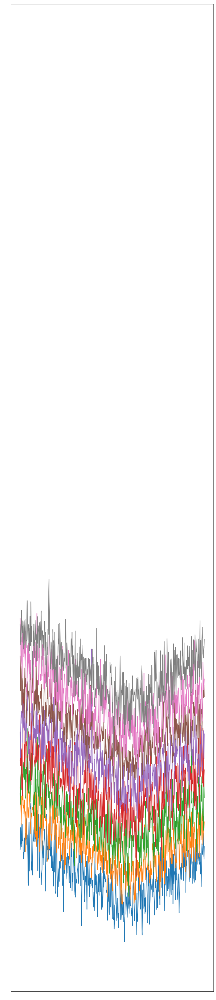

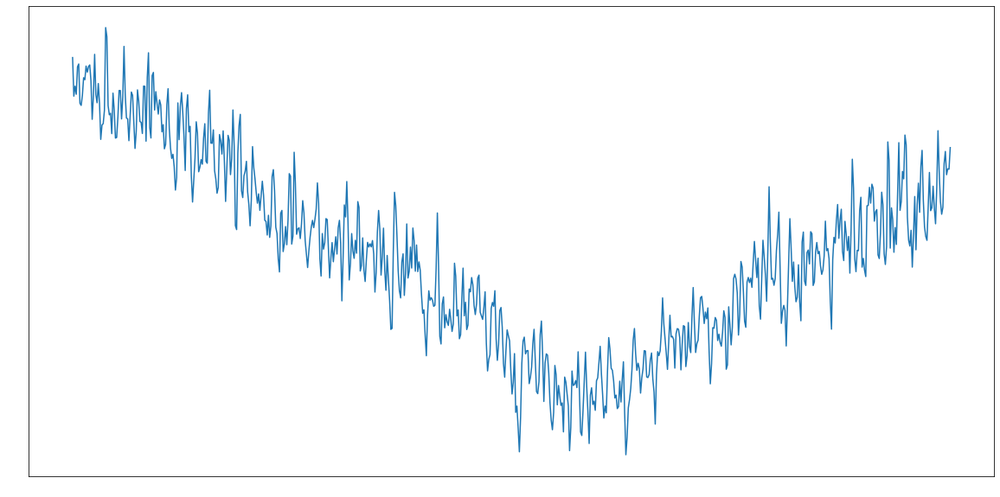

In [13]:
#uves caII
path = '/home/nwal/Desktop/PG0010/PG0010Reflex/comb/'
fluxes = []
wavels = []
count = 0
with open(path+'blues') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        fluxes.append(flx)
        wavels.append(wvl)
        count = count+1
        
path = '/home/nwal/Desktop/PG0010/PG0010Reflex/comb/log/'
dates2 = []
with open(path+'combs') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()
print(dates2)
esovlt = EarthLocation.from_geodetic(lat=-24.6275*u.deg, lon=-70.4044*u.deg, height=2635*u.m)
sc = SkyCoord("00:13:21.0725724609 +28:20:19.825834604", frame=ICRS, unit=(u.hourangle, u.deg))
baryCorr = []
for el in dates2:
    barycorr = sc.radial_velocity_correction(obstime=Time(el, format='mjd'), location=esovlt)  
    baryCorr.append(barycorr.to(u.km/u.s).value)
    
print(baryCorr)
adjFlux = []
adjWvl = []

for count, value in enumerate(wavels):
    newF, newW = dopplerShift(value, fluxes[count],baryCorr[count],edgeHandling='fillValue',fillValue=1)
    adjFlux.append(newF)
    adjWvl.append(newW)
    
fluxAdj = []
for count, value in enumerate(wavels):
    input_spectra = Spectrum1D(flux=adjFlux[count]* u.mJy,spectral_axis=value*u.Angstrom)
    resample_grid = resample_gridGraces
    fluxc_resample = FluxConservingResampler()
    output_spectrum1D = fluxc_resample(input_spectra, resample_grid)
    fluxAdj.append(np.nan_to_num(output_spectrum1D.flux, copy=False, nan=0.0))

    
plt.figure(figsize=(10,50))
fluxAdjWeighted = []
cummulative = np.zeros_like(fluxAdj[0])
cummulative = cummulative.value
cc = 0
for el in fluxAdj:
    plt.plot(resample_grid, el/np.median(el)+cc*0.1)
    plt.ylim(0.6,4.)
    stedies = 1/np.std(el/np.median(el))
    fluxAdjWeighted.append(stedies*el/np.median(el))
    cummulative = cummulative+stedies*el.value/np.median(el.value)
    cc = cc + 1
    #plt.show()
plt.show()
plt.figure(figsize=(20,10))
plt.plot(resample_grid, cummulative)

[58048.087231362, 58048.095396827, 58049.059279581, 58049.06745199, 58072.022561301, 58072.030731163, 58075.020719284, 58075.028889355]
[-6.756516397364842, -6.77909364226776, -7.14517772002619, -7.166972865612993, -16.901309365321726, -16.92326996555835, -18.031868401471787, -18.0538182950575]


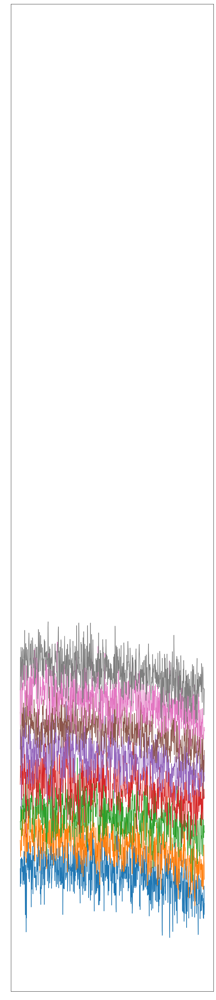

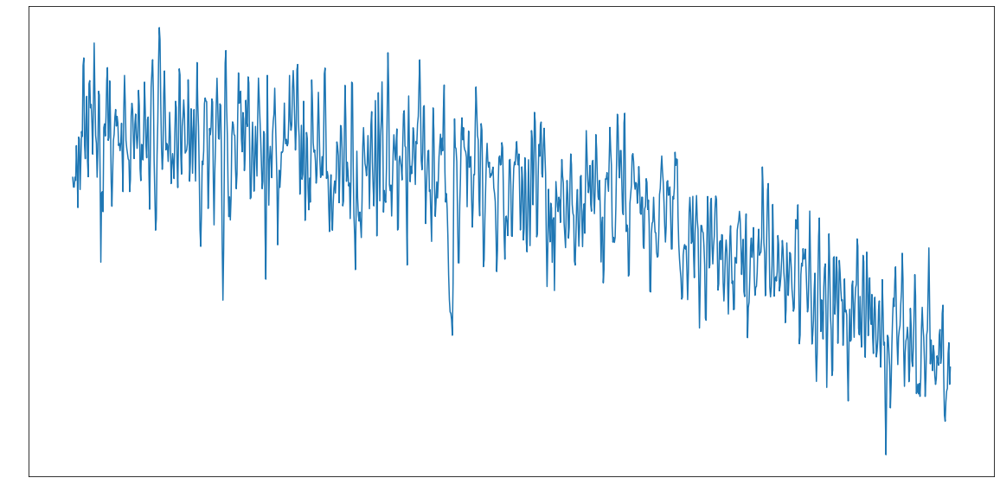

In [14]:
#uves caII
path = '/home/nwal/Desktop/PG0010/PG0010Reflex/comb/'
fluxes = []
wavels = []
count = 0
with open(path+'blues') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        fluxes.append(flx)
        wavels.append(wvl)
        count = count+1
        
path = '/home/nwal/Desktop/PG0010/PG0010Reflex/comb/log/'
dates2 = []
with open(path+'combs') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()
print(dates2)
esovlt = EarthLocation.from_geodetic(lat=-24.6275*u.deg, lon=-70.4044*u.deg, height=2635*u.m)
sc = SkyCoord("00:13:21.0725724609 +28:20:19.825834604", frame=ICRS, unit=(u.hourangle, u.deg))
baryCorr = []
for el in dates2:
    barycorr = sc.radial_velocity_correction(obstime=Time(el, format='mjd'), location=esovlt)  
    baryCorr.append(barycorr.to(u.km/u.s).value)
    
print(baryCorr)
adjFlux = []
adjWvl = []

for count, value in enumerate(wavels):
    newF, newW = dopplerShift(value, fluxes[count],baryCorr[count],edgeHandling='fillValue',fillValue=1)
    adjFlux.append(newF)
    adjWvl.append(newW)
    
fluxAdj = []
for count, value in enumerate(wavels):
    input_spectra = Spectrum1D(flux=adjFlux[count]* u.mJy,spectral_axis=value*u.Angstrom)
    resample_grid = wavels[0][24550:-22700]*u.Angstrom
    fluxc_resample = FluxConservingResampler()
    output_spectrum1D = fluxc_resample(input_spectra, resample_grid)
    fluxAdj.append(np.nan_to_num(output_spectrum1D.flux, copy=False, nan=0.0))

    
plt.figure(figsize=(10,50))
fluxAdjWeighted = []
cummulative = np.zeros_like(fluxAdj[0])
cummulative = cummulative.value
cc = 0
for el in fluxAdj:
    plt.plot(resample_grid, el/np.median(el)+cc*0.1)
    plt.ylim(0.6,4.)
    stedies = 1/np.std(el/np.median(el))
    fluxAdjWeighted.append(stedies*el/np.median(el))
    cummulative = cummulative+stedies*el.value/np.median(el.value)
    cc = cc + 1
    #plt.show()
plt.show()
plt.figure(figsize=(20,10))
plt.plot(resample_grid, cummulative)

In [15]:
#graces Ca

#graces MG
path = '/home/nwal/Desktop/PG0010/gracesReSub/comb/'
fluxes = []
wavels = []
count = 0
with open(path+'CaIOrder') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        fluxes.append(flx)
        wavels.append(wvl)
        count = count+1
        
path = '/home/nwal/Desktop/toEmail/20/'
dates2 = []
with open(path+'utcs') as file:
    for line in file:
        line = line.strip('\n')
        line = Time(line)
        dates2.append(line.mjd)
print(dates2)

[58797.24431347222, 58797.26672112269, 58797.28909356482, 58798.25334054398, 58798.27578582176, 58798.29820037037, 58799.21763303241, 58799.23961329861, 58799.261685590274, 58799.42143079861, 58799.4439324537, 58799.46640207176]


[-14.773235388874875, -14.833861894527576, -14.89623046337069, -15.201194943442786, -15.262928419258516, -15.325863198320945, -15.507377906183553, -15.56399090921861, -15.623584829569795, -16.044651097935894, -16.089961067182113, -16.12912706501529]


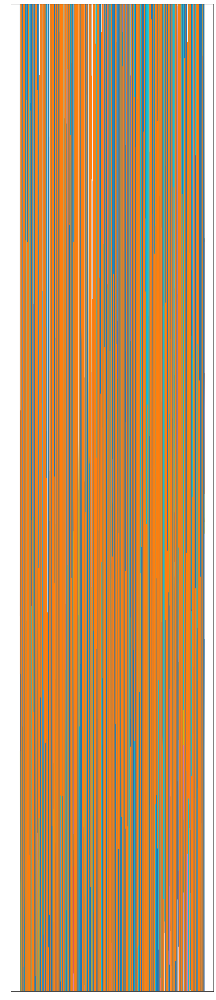

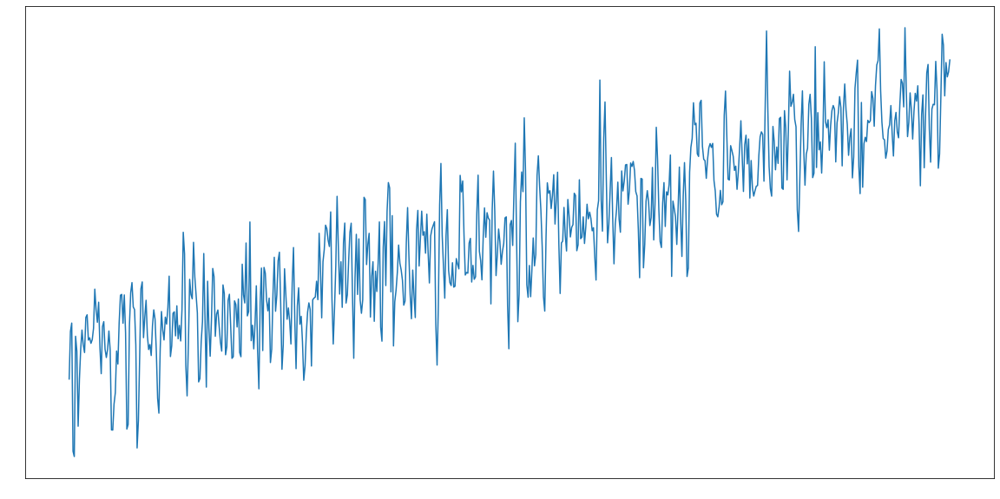

In [16]:
esovlt = EarthLocation.from_geodetic(lat=19.8238*u.deg, lon=-155.4689*u.deg, height=4213*u.m)
sc = SkyCoord("00:13:21.0725724609 +28:20:19.825834604", frame=ICRS, unit=(u.hourangle, u.deg))
baryCorr = []
for el in dates2:
    barycorr = sc.radial_velocity_correction(obstime=Time(el, format='mjd'), location=esovlt)  
    baryCorr.append(barycorr.to(u.km/u.s).value)
    
print(baryCorr)

adjFlux = []
adjWvl = []

for count, value in enumerate(wavels):
    newF, newW = dopplerShift(value, fluxes[count],baryCorr[count],edgeHandling='fillValue',fillValue=1)
    adjFlux.append(newF)
    adjWvl.append(newW)
    
fluxAdj = []
for count, value in enumerate(wavels):
    input_spectra = Spectrum1D(flux=adjFlux[count]* u.mJy,spectral_axis=value*u.Angstrom)
    resample_grid = wavels[0][970:-2950]*u.Angstrom
    fluxc_resample = FluxConservingResampler()
    output_spectrum1D = fluxc_resample(input_spectra, resample_grid)
    fluxAdj.append(np.nan_to_num(output_spectrum1D.flux, copy=False, nan=0.0))

    
plt.figure(figsize=(10,50))
fluxAdjWeighted = []
cummulative = np.zeros_like(fluxAdj[0])
cummulative = cummulative.value
cc = 0
for el in fluxAdj:
    plt.plot(resample_grid, el/np.median(el)+cc*0.1)
    plt.ylim(0.6,4.)
    stedies = 1/np.std(el/np.median(el))
    fluxAdjWeighted.append(stedies*el/np.median(el))
    cummulative = cummulative+stedies*el.value/np.median(el.value)
    cc = cc + 1
    #plt.show()
plt.show()
plt.figure(figsize=(20,10))
plt.plot(resample_grid, cummulative)

In [17]:
resample_gridGraces = resample_grid
cummulativeGraces = cummulative

[58048.087231362, 58048.095396827, 58049.059279581, 58049.06745199, 58072.022561301, 58072.030731163, 58075.020719284, 58075.028889355]
[-6.756516397364842, -6.77909364226776, -7.14517772002619, -7.166972865612993, -16.901309365321726, -16.92326996555835, -18.031868401471787, -18.0538182950575]


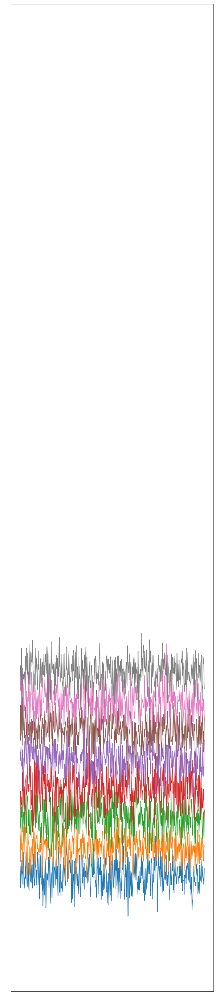

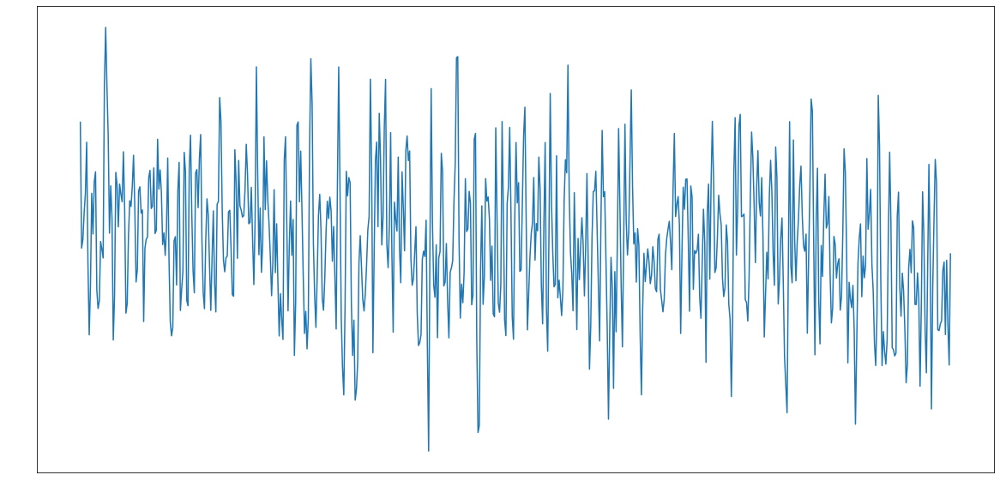

In [18]:
#uves caI
path = '/home/nwal/Desktop/PG0010/PG0010Reflex/comb/'
fluxes = []
wavels = []
count = 0
with open(path+'blues') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        fluxes.append(flx)
        wavels.append(wvl)
        count = count+1
        
path = '/home/nwal/Desktop/PG0010/PG0010Reflex/comb/log/'
dates2 = []
with open(path+'combs') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()
print(dates2)
esovlt = EarthLocation.from_geodetic(lat=-24.6275*u.deg, lon=-70.4044*u.deg, height=2635*u.m)
sc = SkyCoord("00:13:21.0725724609 +28:20:19.825834604", frame=ICRS, unit=(u.hourangle, u.deg))
baryCorr = []
for el in dates2:
    barycorr = sc.radial_velocity_correction(obstime=Time(el, format='mjd'), location=esovlt)  
    baryCorr.append(barycorr.to(u.km/u.s).value)
    
print(baryCorr)
adjFlux = []
adjWvl = []

for count, value in enumerate(wavels):
    newF, newW = dopplerShift(value, fluxes[count],baryCorr[count],edgeHandling='fillValue',fillValue=1)
    adjFlux.append(newF)
    adjWvl.append(newW)
    
fluxAdj = []
for count, value in enumerate(wavels):
    input_spectra = Spectrum1D(flux=adjFlux[count]* u.mJy,spectral_axis=value*u.Angstrom)
    resample_grid = resample_gridGraces
    fluxc_resample = FluxConservingResampler()
    output_spectrum1D = fluxc_resample(input_spectra, resample_grid)
    fluxAdj.append(np.nan_to_num(output_spectrum1D.flux, copy=False, nan=0.0))

    
plt.figure(figsize=(10,50))
fluxAdjWeighted = []
cummulative = np.zeros_like(fluxAdj[0])
cummulative = cummulative.value
cc = 0
for el in fluxAdj:
    plt.plot(resample_grid, el/np.median(el)+cc*0.1)
    plt.ylim(0.6,4.)
    stedies = 1/np.std(el/np.median(el))
    fluxAdjWeighted.append(stedies*el/np.median(el))
    cummulative = cummulative+stedies*el.value/np.median(el.value)
    cc = cc + 1
    #plt.show()
plt.show()
plt.figure(figsize=(20,10))
plt.plot(resample_grid, cummulative)

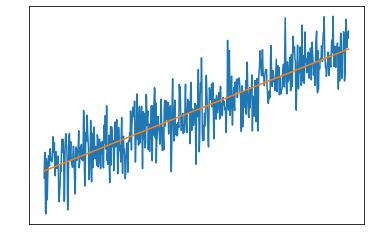

2.424164039094329
55.74714468968028


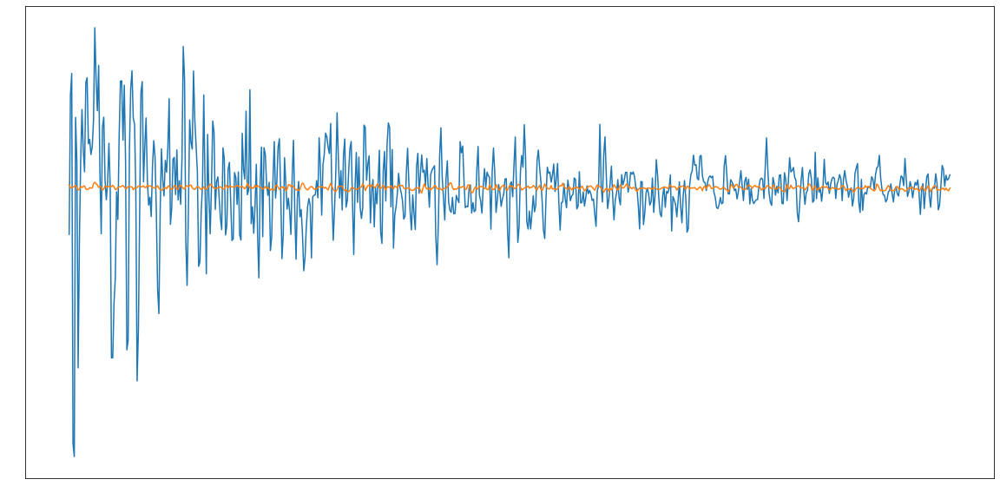

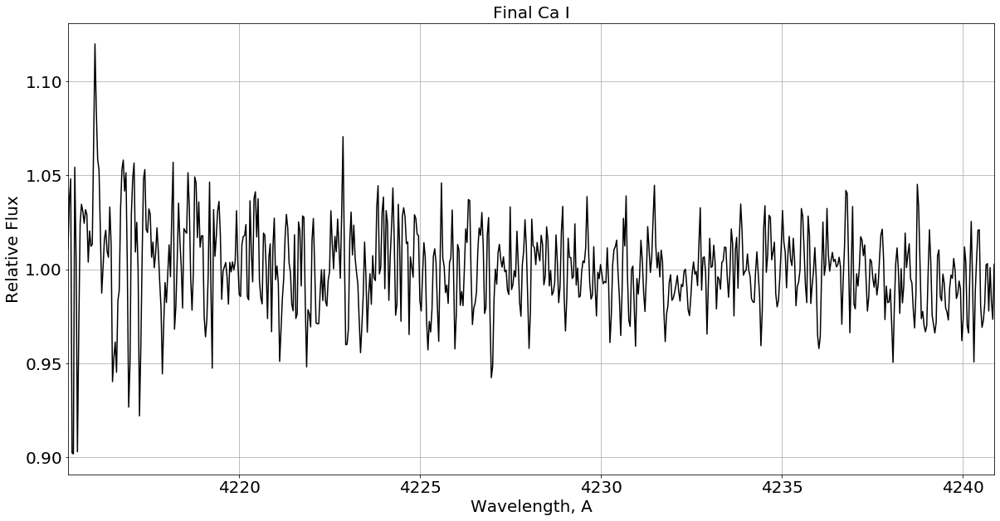

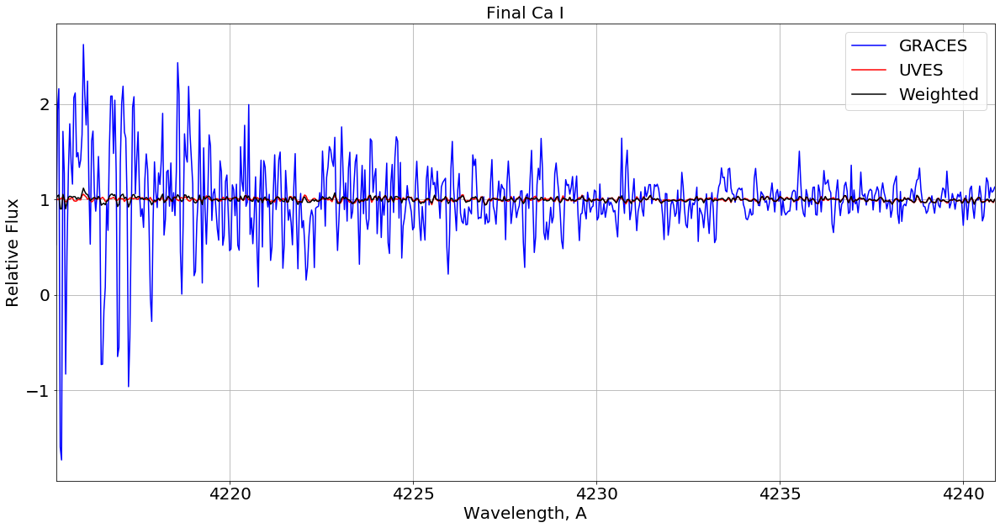

In [19]:
grad,offset = np.poly1d(np.polyfit(resample_gridGraces.value, cummulativeGraces.value, 1))
plt.plot(resample_gridGraces,cummulativeGraces)
plt.plot(resample_gridGraces, resample_gridGraces.value*grad+offset)

cummulativeGracesCorrected = cummulativeGraces.value/(resample_gridGraces.value*grad+offset)
plt.show()
plt.figure(figsize=(20,10))
plt.plot(resample_gridGraces,cummulativeGracesCorrected)
plt.plot(resample_grid, cummulative/np.median(cummulative))

print(1/np.std(cummulativeGracesCorrected))
print(1/np.std(cummulative/np.median(cummulative)))
final_flux = (2.251867526188181*cummulativeGracesCorrected)+53.27175619299466*(cummulative/np.median(cummulative))
final_flux = final_flux/np.median(final_flux)
plt.rc('xtick',c='k')
plt.rc('ytick',c='k')
plt.figure(figsize=(20,10))
plt.title('Final Ca I',fontsize=20)
plt.plot(resample_grid,final_flux,c='k')
#plt.plot(resample_gridGraces,cummulativeGracesCorrected)
#plt.plot(resample_grid, cummulative/np.median(cummulative))
plt.xlim(resample_grid.value[0], resample_grid.value[-1])
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel('Wavelength, A',fontsize=20)
plt.ylabel('Relative Flux',fontsize=20)
plt.grid()
plt.savefig('PG0010_CaI_Master.pdf')
plt.show()



plt.figure(figsize=(20,10))
plt.title('Final Ca I',fontsize=20)
plt.plot(resample_gridGraces,cummulativeGracesCorrected,c='b', label='GRACES')
plt.plot(resample_grid, cummulative/np.median(cummulative),c='r', label='UVES')
plt.plot(resample_grid,final_flux,c='k', label='Weighted')

plt.xlim(resample_grid.value[0], resample_grid.value[-1])
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel('Wavelength, A',fontsize=20)
plt.ylabel('Relative Flux',fontsize=20)
plt.legend(fontsize=20)
plt.grid()
plt.savefig('PG0010_CaI_MasterAll.pdf')
plt.show()


plt.rc('xtick',c='w')
plt.rc('ytick',c='w')

In [20]:
#graces HAlpha

path = '/home/nwal/Desktop/PG0010/gracesReSub/comb/'
fluxes = []
wavels = []
count = 0
with open(path+'HAlpha') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        fluxes.append(flx)
        wavels.append(wvl)
        count = count+1
        
path = '/home/nwal/Desktop/toEmail/20/'
dates2 = []
with open(path+'utcs') as file:
    for line in file:
        line = line.strip('\n')
        line = Time(line)
        dates2.append(line.mjd)
print(dates2)

[58797.24431347222, 58797.26672112269, 58797.28909356482, 58798.25334054398, 58798.27578582176, 58798.29820037037, 58799.21763303241, 58799.23961329861, 58799.261685590274, 58799.42143079861, 58799.4439324537, 58799.46640207176]


[-14.773235388874875, -14.833861894527576, -14.89623046337069, -15.201194943442786, -15.262928419258516, -15.325863198320945, -15.507377906183553, -15.56399090921861, -15.623584829569795, -16.044651097935894, -16.089961067182113, -16.12912706501529]


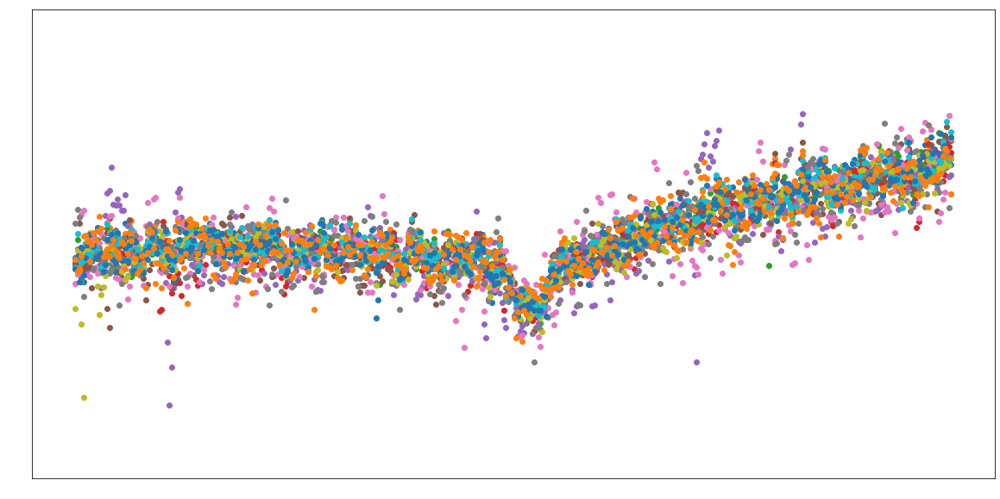

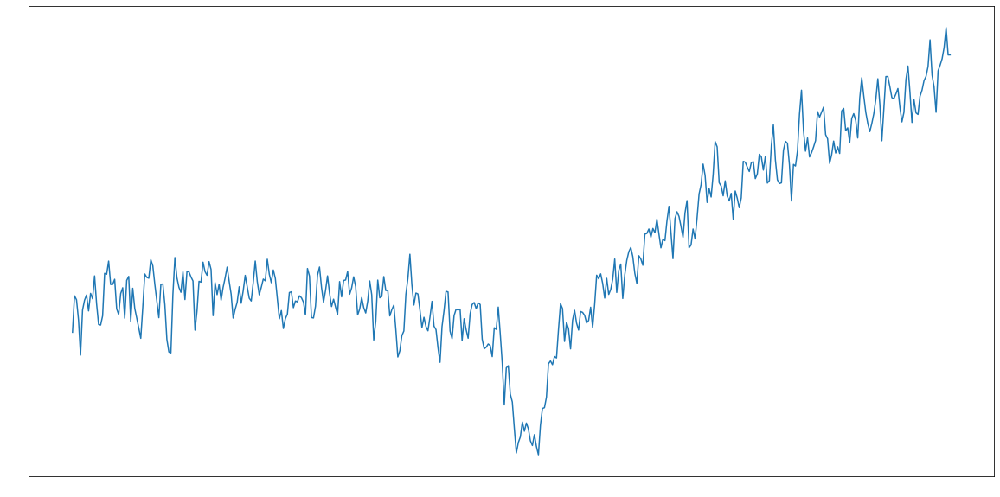

In [21]:
esovlt = EarthLocation.from_geodetic(lat=19.8238*u.deg, lon=-155.4689*u.deg, height=4213*u.m)
sc = SkyCoord("00:13:21.0725724609 +28:20:19.825834604", frame=ICRS, unit=(u.hourangle, u.deg))
baryCorr = []
for el in dates2:
    barycorr = sc.radial_velocity_correction(obstime=Time(el, format='mjd'), location=esovlt)  
    baryCorr.append(barycorr.to(u.km/u.s).value)
    
print(baryCorr)
adjFlux = []
adjWvl = []

for count, value in enumerate(wavels):
    newF, newW = dopplerShift(value, fluxes[count],baryCorr[count],edgeHandling='fillValue',fillValue=1)
    adjFlux.append(newF)
    adjWvl.append(newW)
    
fluxAdj = []
for count, value in enumerate(wavels):
    input_spectra = Spectrum1D(flux=adjFlux[count]* u.mJy,spectral_axis=value*u.Angstrom)
    resample_grid = wavels[0][600:-3570]*u.Angstrom
    fluxc_resample = FluxConservingResampler()
    output_spectrum1D = fluxc_resample(input_spectra, resample_grid)
    fluxAdj.append(np.nan_to_num(output_spectrum1D.flux, copy=False, nan=0.0))

    
plt.figure(figsize=(20,10))
fluxAdjWeighted = []
cummulative = np.zeros_like(fluxAdj[0])
cummulative = cummulative.value
medianArray = []
for k in range(len(cummulative)):
    medDispatch = [fluxAdj[0][k].value,fluxAdj[1][k].value,fluxAdj[2][k].value,
                   fluxAdj[3][k].value,fluxAdj[4][k].value,fluxAdj[5][k].value,
                   fluxAdj[6][k].value,fluxAdj[7][k].value,fluxAdj[8][k].value,
                   fluxAdj[9][k].value,fluxAdj[10][k].value,fluxAdj[11][k].value]
    thisEl = np.median(medDispatch)
    medianArray.append(thisEl)
for ccount, el in enumerate(fluxAdj):
    for count, value in enumerate(el.value):
        if np.abs(value) > np.abs(medianArray[count])*1.1:
            fluxAdj[ccount][count]=medianArray[count]* u.mJy
            #print('True')
    plt.plot(resample_grid, fluxAdj[ccount]/np.median(fluxAdj[ccount]), marker='o',ls='')
    plt.ylim(0,2)
    stedies = 1/np.std(fluxAdj[ccount]/np.median(fluxAdj[ccount]))
    fluxAdjWeighted.append(stedies*fluxAdj[ccount]/np.median(fluxAdj[ccount]))
    cummulative = cummulative+stedies*fluxAdj[ccount].value/np.median(fluxAdj[ccount].value)
    #plt.show()
plt.show()
plt.figure(figsize=(20,10))
plt.plot(resample_grid, cummulative)


resample_gridGraces = resample_grid
cummulativeGraces = cummulative

In [6]:
plt.plot(wavelsHIRES[0], fluxesHIRES[0])
plt.plot(wavelsHIRES[1], fluxesHIRES[1])
plt.ylim(0,1500)

NameError: name 'wavelsHIRES' is not defined

[9.351976677274921, 9.351976677274921]


/home/nwal/anaconda3/lib/python3.7/site-packages/astropy/units/quantity.py:481: RuntimeWarning: invalid value encountered in true_divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


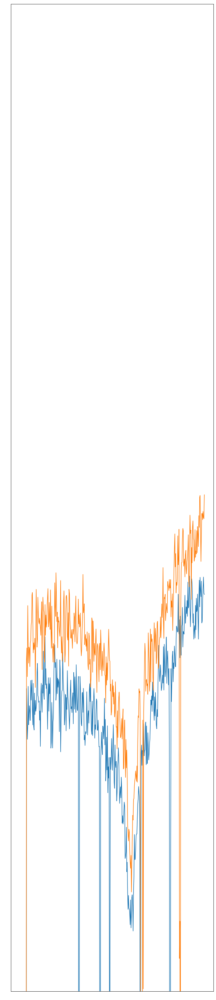

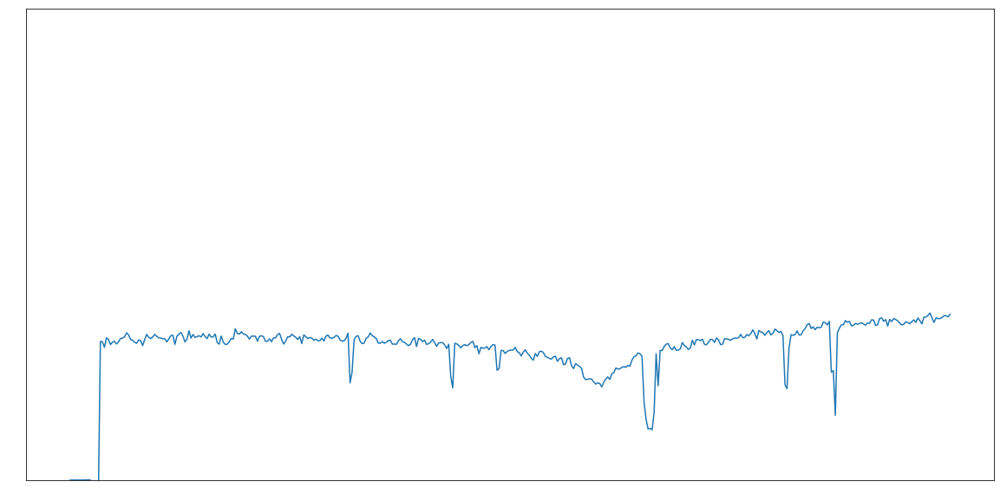

In [22]:
hiresDates = [56552,56552]

fits_image_filename = '/home/nwal/Desktop/PG0010/HIRES/Obj_0043G.fits'
with fits.open(fits_image_filename) as hdul:
    data = hdul[1].data
wavels = []
fluxes = []
for el in data:
    wavels.append(el[24])
    fluxes.append(el[25])
wavels = wavels[7]
fluxes = fluxes[7]
fluxesHIRES = fluxes[:-2000]
wavelsHIRES = wavels[:-2000]


fits_image_filename = '/home/nwal/Desktop/PG0010/HIRES/Obj_0044G.fits'
with fits.open(fits_image_filename) as hdul:
    data = hdul[1].data
wavels = []
fluxes = []
for el in data:
    wavels.append(el[24])
    fluxes.append(el[25])
    
wavels = wavels[7]
fluxes = fluxes[7]
fluxesHIRES = np.vstack((fluxesHIRES, fluxes[:-2000]))
wavelsHIRES = np.vstack((wavelsHIRES,wavels[:-2000]))

esovlt = EarthLocation.from_geodetic(lat=19.82833333*u.deg, lon=-155.47833333*u.deg, height=4160*u.m)
sc = SkyCoord("00:13:21.0725724609 +28:20:19.825834604", frame=ICRS, unit=(u.hourangle, u.deg))
baryCorr = []
for el in hiresDates:
    barycorr = sc.radial_velocity_correction(obstime=Time(el, format='mjd'), location=esovlt)  
    baryCorr.append(barycorr.to(u.km/u.s).value)
    
print(baryCorr)
baryCorrDummy = baryCorr#[-80,-80]
adjFlux = []
adjWvl = []

for count, value in enumerate(wavelsHIRES):
    newF, newW = dopplerShift(value, fluxesHIRES[count],baryCorrDummy[count],edgeHandling='fillValue',fillValue=1)
    adjFlux.append(newF)
    adjWvl.append(newW)
    
fluxAdj = []
for count, value in enumerate(wavelsHIRES):
    input_spectra = Spectrum1D(flux=adjFlux[count]* u.mJy,spectral_axis=value*u.Angstrom)
    resample_grid = resample_gridGraces
    fluxc_resample = FluxConservingResampler()
    output_spectrum1D = fluxc_resample(input_spectra, resample_grid)
    fluxAdj.append(np.nan_to_num(output_spectrum1D.flux, copy=False, nan=0.0))

    
plt.figure(figsize=(10,50))
fluxAdjWeighted = []
cummulative = np.zeros_like(fluxAdj[0])
cummulative = cummulative.value
cc = 0
for el in fluxAdj:
    plt.plot(resample_grid, el/np.median(el)+cc*0.1)
    plt.ylim(0.6,2.)
    stedies = 1/np.std(el/np.median(el))
    fluxAdjWeighted.append(stedies*el/np.median(el))
    cummulative = cummulative+stedies*el.value/np.median(el.value)
    cc = cc + 1
    #plt.show()
plt.show()
plt.figure(figsize=(20,10))
plt.ylim(0,3)
plt.plot(resample_grid, cummulative)

resample_gridHIRES = resample_grid
cummulativeHIRES = cummulative

[58048.087231362, 58048.095396827, 58049.059279581, 58049.06745199, 58072.022561301, 58072.030731163, 58075.020719284, 58075.028889355]
[-6.756516397364842, -6.77909364226776, -7.14517772002619, -7.166972865612993, -16.901309365321726, -16.92326996555835, -18.031868401471787, -18.0538182950575]


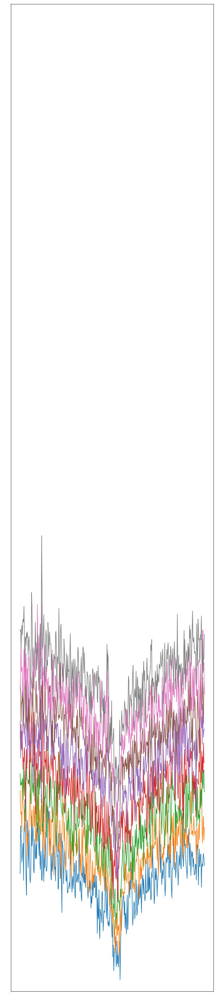

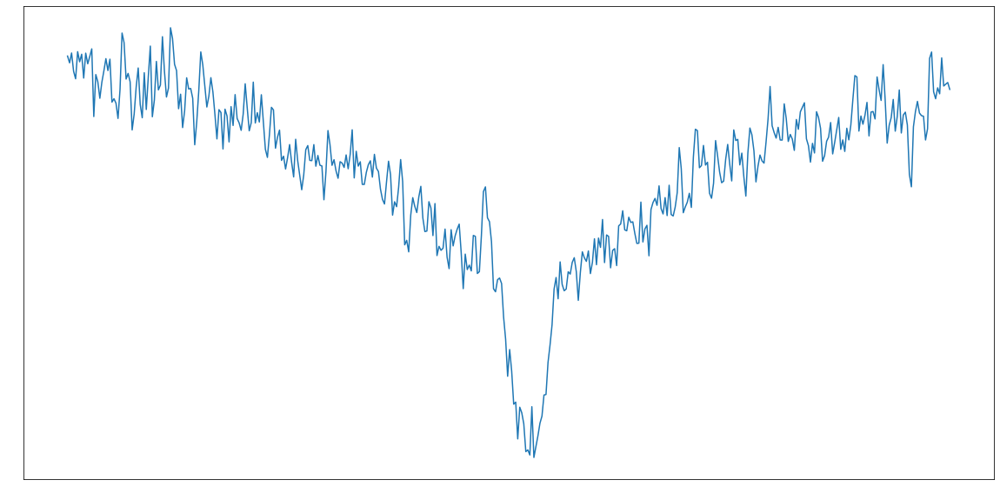

In [23]:
#uves caI
path = '/home/nwal/Desktop/PG0010/PG0010Reflex/comb/'
fluxes = []
wavels = []
count = 0
with open(path+'redus') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        fluxes.append(flx)
        wavels.append(wvl)
        count = count+1
        
path = '/home/nwal/Desktop/PG0010/PG0010Reflex/comb/log/'
dates2 = []
with open(path+'combs') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()
print(dates2)
esovlt = EarthLocation.from_geodetic(lat=-24.6275*u.deg, lon=-70.4044*u.deg, height=2635*u.m)
sc = SkyCoord("00:13:21.0725724609 +28:20:19.825834604", frame=ICRS, unit=(u.hourangle, u.deg))
baryCorr = []
for el in dates2:
    barycorr = sc.radial_velocity_correction(obstime=Time(el, format='mjd'), location=esovlt)  
    baryCorr.append(barycorr.to(u.km/u.s).value)
    
print(baryCorr)

adjFlux = []
adjWvl = []

for count, value in enumerate(wavels):
    newF, newW = dopplerShift(value, fluxes[count],baryCorr[count],edgeHandling='fillValue',fillValue=1)
    adjFlux.append(newF)
    adjWvl.append(newW)
    
fluxAdj = []
for count, value in enumerate(wavels):
    input_spectra = Spectrum1D(flux=adjFlux[count]* u.mJy,spectral_axis=value*u.Angstrom)
    resample_grid = resample_gridGraces
    fluxc_resample = FluxConservingResampler()
    output_spectrum1D = fluxc_resample(input_spectra, resample_grid)
    fluxAdj.append(np.nan_to_num(output_spectrum1D.flux, copy=False, nan=0.0))

    
plt.figure(figsize=(10,50))
fluxAdjWeighted = []
cummulative = np.zeros_like(fluxAdj[0])
cummulative = cummulative.value
cc = 0
for el in fluxAdj:
    plt.plot(resample_grid, el/np.median(el)+cc*0.1)
    plt.ylim(0.6,4.)
    stedies = 1/np.std(el/np.median(el))
    fluxAdjWeighted.append(stedies*el/np.median(el))
    cummulative = cummulative+stedies*el.value/np.median(el.value)
    cc = cc + 1
    #plt.show()
plt.show()
plt.figure(figsize=(20,10))
plt.plot(resample_grid, cummulative)


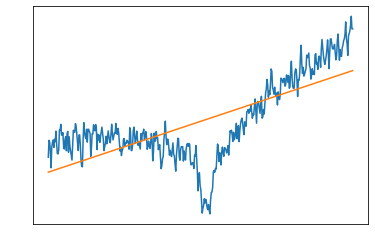

9.98857381351581
10.435057249032806


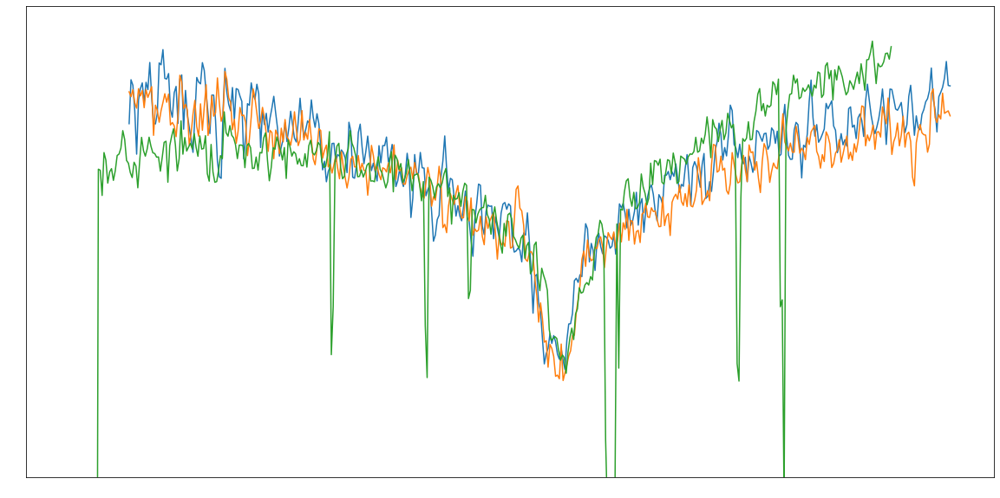

In [25]:
grad,offset = np.poly1d(np.polyfit(resample_gridGraces.value, cummulativeGraces.value, 1))
plt.plot(resample_gridGraces,cummulativeGraces)
plt.plot(resample_gridGraces, resample_gridGraces.value*grad+offset)

cummulativeGracesCorrected = cummulativeGraces.value/(resample_gridGraces.value*grad+offset)
plt.show()
plt.figure(figsize=(20,10))
plt.plot(resample_gridGraces,cummulativeGracesCorrected)
plt.plot(resample_grid, cummulative/np.median(cummulative))
plt.plot(resample_gridHIRES-1.813*u.Angstrom, cummulativeHIRES/np.median(cummulativeHIRES))
plt.ylim(0.5,1.25)

print(1/np.std(cummulativeGracesCorrected))
print(1/np.std(cummulative/np.median(cummulative)))

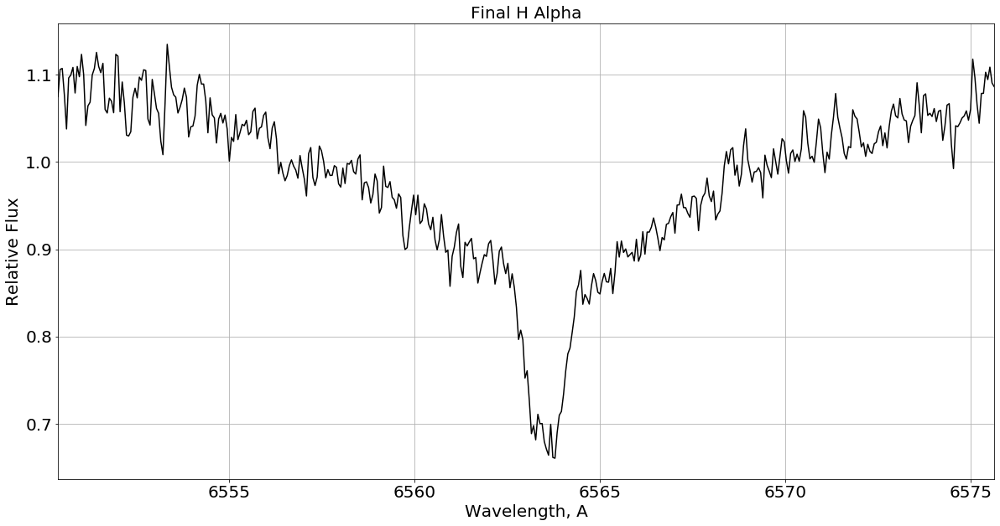

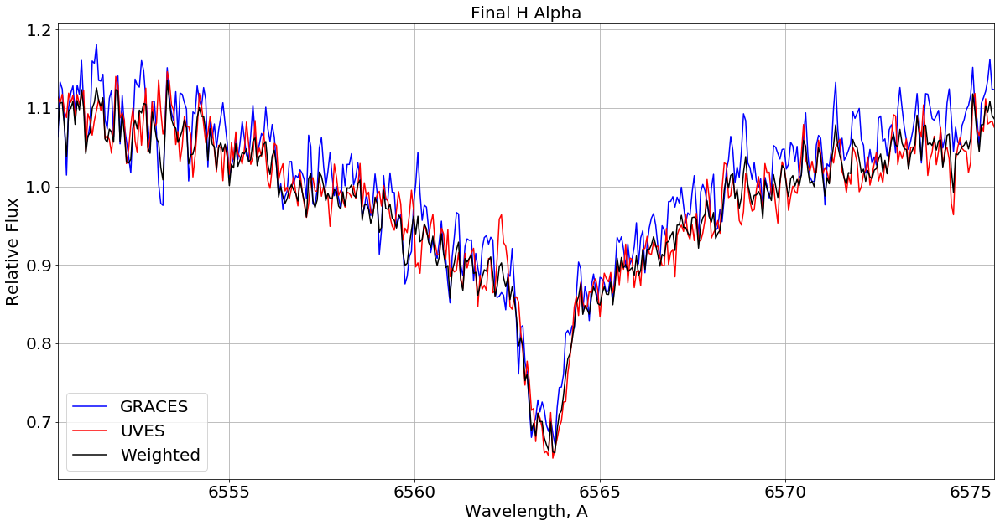

In [26]:

final_flux = (10.577428620373437*cummulativeGracesCorrected)+10.32973259047681*(cummulative/np.median(cummulative))
final_flux = final_flux/np.median(final_flux)
plt.rc('xtick',c='k')
plt.rc('ytick',c='k')
plt.figure(figsize=(20,10))
plt.title('Final H Alpha',fontsize=20)
plt.plot(resample_grid,final_flux,c='k')
#plt.plot(resample_gridGraces,cummulativeGracesCorrected)
#plt.plot(resample_grid, cummulative/np.median(cummulative))
plt.xlim(resample_grid.value[0], resample_grid.value[-1])
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel('Wavelength, A',fontsize=20)
plt.ylabel('Relative Flux',fontsize=20)
plt.grid()
plt.savefig('PG0010_HAlpha_Master.pdf')
plt.show()



plt.figure(figsize=(20,10))
plt.title('Final H Alpha',fontsize=20)
plt.plot(resample_gridGraces,cummulativeGracesCorrected,c='b', label='GRACES')
plt.plot(resample_grid, cummulative/np.median(cummulative),c='r', label='UVES')
plt.plot(resample_grid,final_flux,c='k', label='Weighted')

plt.xlim(resample_grid.value[0], resample_grid.value[-1])
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel('Wavelength, A',fontsize=20)
plt.ylabel('Relative Flux',fontsize=20)
plt.legend(fontsize=20)
plt.grid()
plt.savefig('PG0010_HAlpha_MasterAll.pdf')
plt.show()


plt.rc('xtick',c='w')
plt.rc('ytick',c='w')

[58797.24431347222, 58797.26672112269, 58797.28909356482, 58798.25334054398, 58798.27578582176, 58798.29820037037, 58799.21763303241, 58799.23961329861, 58799.261685590274, 58799.42143079861, 58799.4439324537, 58799.46640207176]


[-14.773235388874875, -14.833861894527576, -14.89623046337069, -15.201194943442786, -15.262928419258516, -15.325863198320945, -15.507377906183553, -15.56399090921861, -15.623584829569795, -16.044651097935894, -16.089961067182113, -16.12912706501529]


[-6.756516397364842, -6.77909364226776, -7.14517772002619, -7.166972865612993, -16.901309365321726, -16.92326996555835, -18.031868401471787, -18.0538182950575]


[58048.087231362, 58048.095396827, 58049.059279581, 58049.06745199, 58072.022561301, 58072.030731163, 58075.020719284, 58075.028889355]
[-6.756516397364842, -6.77909364226776, -7.14517772002619, -7.166972865612993, -16.901309365321726, -16.92326996555835, -18.031868401471787, -18.0538182950575]


<Quantity [3919.72025929, 3919.7471834 , 3919.77410752, ..., 3951.59841064,
           3951.62533476, 3951.65225887] Angstrom>

[58797.24431347222, 58797.26672112269, 58797.28909356482, 58798.25334054398, 58798.27578582176, 58798.29820037037, 58799.21763303241, 58799.23961329861, 58799.261685590274, 58799.42143079861, 58799.4439324537, 58799.46640207176]


[-14.773235388874875, -14.833861894527576, -14.89623046337069, -15.201194943442786, -15.262928419258516, -15.325863198320945, -15.507377906183553, -15.56399090921861, -15.623584829569795, -16.044651097935894, -16.089961067182113, -16.12912706501529]


[58797.24431347222, 58797.26672112269, 58797.28909356482, 58798.25334054398, 58798.27578582176, 58798.29820037037, 58799.21763303241, 58799.23961329861, 58799.261685590274, 58799.42143079861, 58799.4439324537, 58799.46640207176]


[-14.773235388874875, -14.833861894527576, -14.89623046337069, -15.201194943442786, -15.262928419258516, -15.325863198320945, -15.507377906183553, -15.56399090921861, -15.623584829569795, -16.044651097935894, -16.089961067182113, -16.12912706501529]


12

[58048.087231362, 58048.095396827, 58049.059279581, 58049.06745199, 58072.022561301, 58072.030731163, 58075.020719284, 58075.028889355]
[-6.756516397364842, -6.77909364226776, -7.14517772002619, -7.166972865612993, -16.901309365321726, -16.92326996555835, -18.031868401471787, -18.0538182950575]


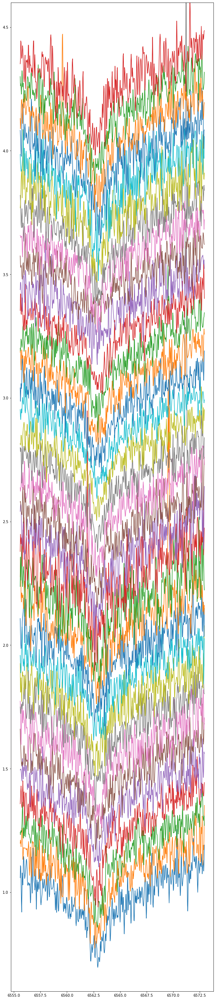

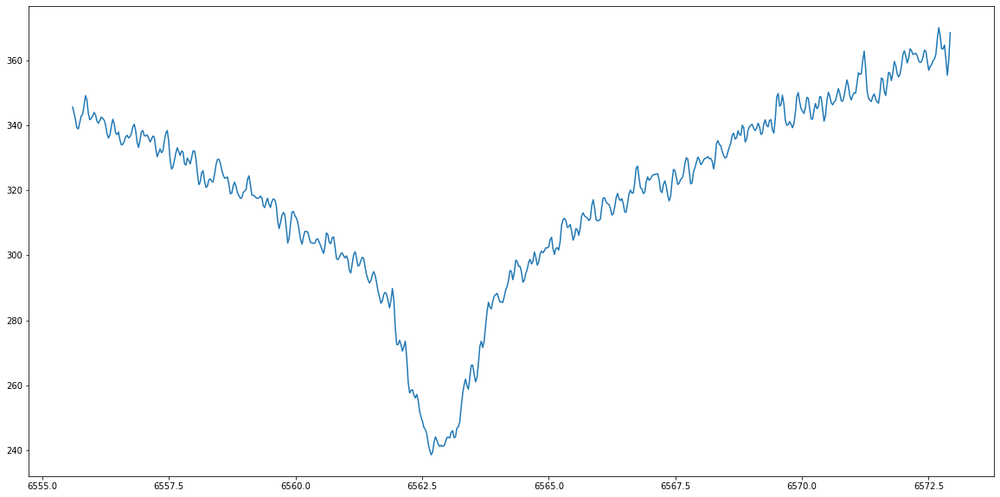

In [25]:
path = '/home/nwal/Desktop/GD1400/reflexFin/'
fluxes = []
wavels = []
count = 0
with open(path+'Stitched') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        flx = flx/np.median(flx)
        fluxes.append(flx[69450:-3910])
        wavels.append(wvl[69450:-3910])
        count = count+1
path = '/home/nwal/Desktop/GD1400/reflexFin/'
dates2 = []
with open(path+'Stitched') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()

model = np.array([54.25640818, 56.35952362, 62.20031293, 61.2206126 , 22.04841691,
       24.10582841, 33.34020562, 36.10985002, 16.91358673, 17.84262664,
       52.09237856, 49.60621251, 25.35319581, 23.20811117, 40.05193304,
       42.87160273, 48.91422031, 46.19307535, 43.17475858, 40.31677462,
       50.37601624, 52.82800467, 55.11330237, 57.14646818, 36.88764516,
       34.11224261, 45.51942318, 48.18928433, 61.30492373, 60.0362804 ,
       42.99912368, 40.18162378, 60.96612731, 60.46110114])
bary = np.array([25.342287187845695, 25.324802622778215, 25.226114727913906, 25.20832603476894, 25.01811236294185, 24.99989228581482, 23.8584050259424, 23.838551477190855, 23.512439009649096, 23.49220987681981, 23.36240026097529, 23.34432399444072, 21.82082371480919, 21.802483214711007, 21.61368572773136, 21.59560467267822, 19.360518600539113, 19.339201674853083, 19.31659038453834, 19.29581928047351, 18.20046245302884, 18.17948585085599, 18.158482948010302, 18.1379753725614, 15.500016456302813, 15.489895692206467, 15.084480282784687, 15.069924147018494, 14.800953417905236, 14.790509828242206, 14.686927704603335, 14.670181021391208, 25.34388299828919, 25.094796669673332])
#print(len(velocitiesCP))
velocitiesCP = model - bary 
velocitiesCP = -velocitiesCP#-np.array(barV)
#print(len(velocitiesCP))
adjFlux = []
adjWvl = []

for count, value in enumerate(wavels):
    newF, newW = dopplerShift(value, fluxes[count],velocitiesCP[count],edgeHandling='fillValue',fillValue=1e-16)
    adjFlux.append(newF)
    adjWvl.append(newW)
    
fluxAdj = []
for count, value in enumerate(wavels):
    input_spectra = Spectrum1D(flux=adjFlux[count]* u.mJy,spectral_axis=value*u.Angstrom)
    resample_grid = wavels[0][200:-100]*u.Angstrom
    fluxc_resample = FluxConservingResampler()
    output_spectrum1D = fluxc_resample(input_spectra, resample_grid)
    fluxAdj.append(output_spectrum1D.flux)    

plt.figure(figsize=(10,50))
fluxAdjWeighted = []
cummulative = np.zeros_like(fluxAdj[0])
cummulative = cummulative.value
cc = 0
for el in fluxAdj:
    plt.plot(resample_grid, el/np.median(el)+cc*0.1)
    plt.ylim(0.6,4.6)
    stedies = 1/np.std(el/np.median(el))
    fluxAdjWeighted.append(stedies*el/np.median(el))
    cummulative = cummulative+stedies*el.value/np.median(el.value)
    cc = cc + 1
    #plt.show()
plt.show()
plt.figure(figsize=(20,10))
plt.plot(resample_grid, cummulative)

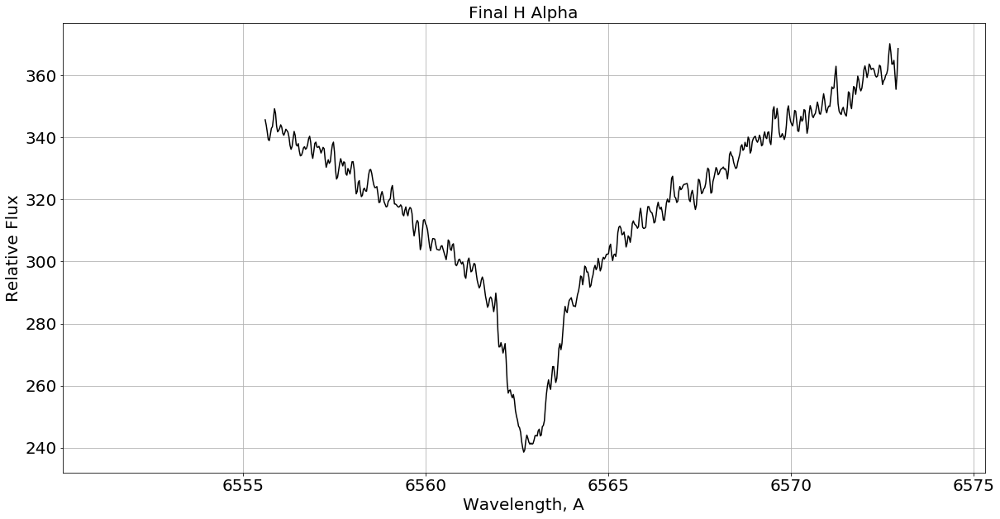

In [26]:

plt.rc('xtick',c='k')
plt.rc('ytick',c='k')
plt.figure(figsize=(20,10))
plt.title('Final H Alpha',fontsize=20)
plt.plot(resample_grid,cummulative,c='k')
#plt.plot(resample_gridGraces,cummulativeGracesCorrected)
#plt.plot(resample_grid, cummulative/np.median(cummulative))
plt.xlim(6550.052, 6575.3056)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.xlabel('Wavelength, A',fontsize=20)
plt.ylabel('Relative Flux',fontsize=20)
plt.grid()
plt.savefig('GD1400_HAlpha_Master.pdf')
plt.show()



array([], dtype=float64)

In [65]:
path = '/home/nwal/Desktop/GD1400/reflexFin/'
fluxes = []
wavels = []
count = 0
with open(path+'blues') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        flx = flx/np.median(flx)
        fluxes.append(flx[-3400:-2460])
        wavels.append(wvl[-3400:-2460])
        count = count+1
path = '/home/nwal/Desktop/GD1400/reflexFin/'
dates2 = []
with open(path+'blues') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()



In [66]:
model = np.array([54.25640818, 56.35952362, 62.20031293, 61.2206126 , 22.04841691,
       24.10582841, 33.34020562, 36.10985002, 16.91358673, 17.84262664,
       52.09237856, 49.60621251, 25.35319581, 23.20811117, 40.05193304,
       42.87160273,
       50.37601624, 52.82800467, 55.11330237, 57.14646818, 36.88764516,
       34.11224261, 45.51942318, 48.18928433, 61.30492373, 60.0362804 ,
       42.99912368, 40.18162378])
bary = np.array([25.342287187845695, 25.324802622778215, 25.226114727913906, 25.20832603476894, 25.01811236294185, 24.99989228581482, 23.8584050259424, 23.838551477190855, 23.512439009649096, 23.49220987681981, 23.36240026097529, 23.34432399444072, 21.82082371480919, 21.802483214711007, 21.61368572773136, 21.59560467267822, 18.20046245302884, 18.17948585085599, 18.158482948010302, 18.1379753725614, 15.500016456302813, 15.489895692206467, 15.084480282784687, 15.069924147018494, 14.800953417905236, 14.790509828242206, 14.686927704603335, 14.670181021391208])

/home/nwal/anaconda3/lib/python3.7/site-packages/astropy/units/quantity.py:481: RuntimeWarning: invalid value encountered in true_divide
  result = super().__array_ufunc__(function, method, *arrays, **kwargs)


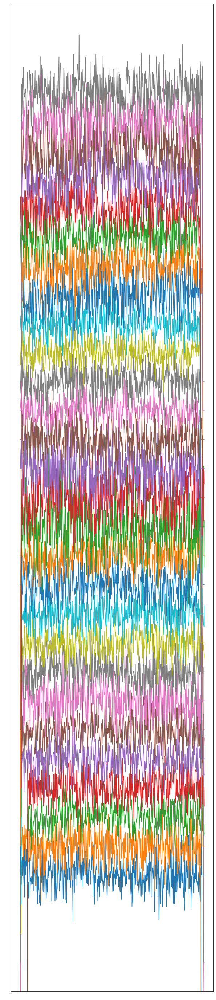

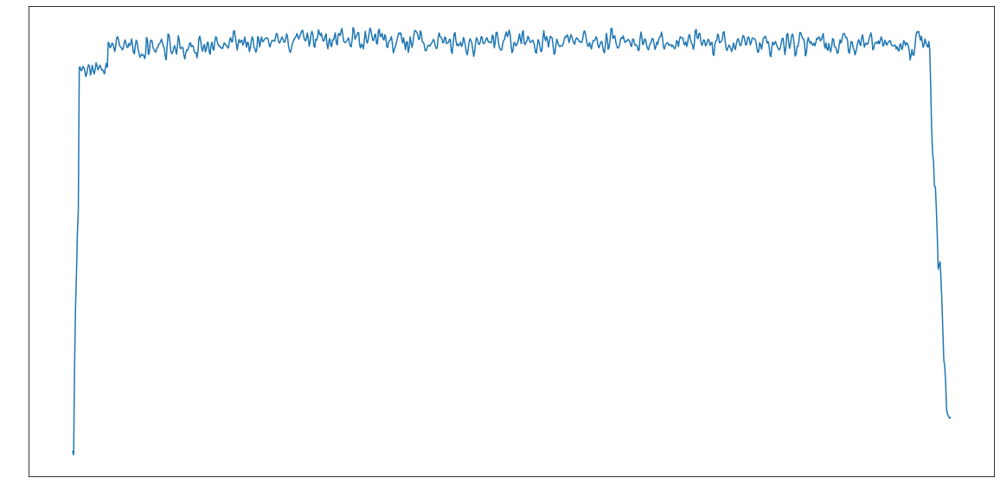

In [67]:
velocitiesCP = model - bary 
velocitiesCP = -velocitiesCP#-np.array(barV)
#print(len(velocitiesCP))
adjFlux = []
adjWvl = []

for count, value in enumerate(wavels):
    newF, newW = dopplerShift(value, fluxes[count],velocitiesCP[count],edgeHandling='fillValue',fillValue=1e-16)
    adjFlux.append(newF)
    adjWvl.append(newW)
    
fluxAdj = []
for count, value in enumerate(wavels):
    input_spectra = Spectrum1D(flux=adjFlux[count]* u.mJy,spectral_axis=value*u.Angstrom)
    resample_grid = wavels[0]*u.Angstrom
    fluxc_resample = FluxConservingResampler()
    output_spectrum1D = fluxc_resample(input_spectra, resample_grid)
    fluxAdj.append(np.nan_to_num(output_spectrum1D.flux, copy=False, nan=0.0))

plt.figure(figsize=(10,50))
fluxAdjWeighted = []
cummulative = np.zeros_like(fluxAdj[0])
cummulative = cummulative.value
cc = 0
for el in fluxAdj:
    plt.plot(resample_grid, el/np.median(el)+cc*0.1)
    plt.ylim(0.6,4.)
    stedies = 1/np.std(el/np.median(el))
    fluxAdjWeighted.append(stedies*el/np.median(el))
    cummulative = cummulative+stedies*el.value/np.median(el.value)
    cc = cc + 1
    #plt.show()
plt.show()
plt.figure(figsize=(20,10))
plt.plot(resample_grid, cummulative)

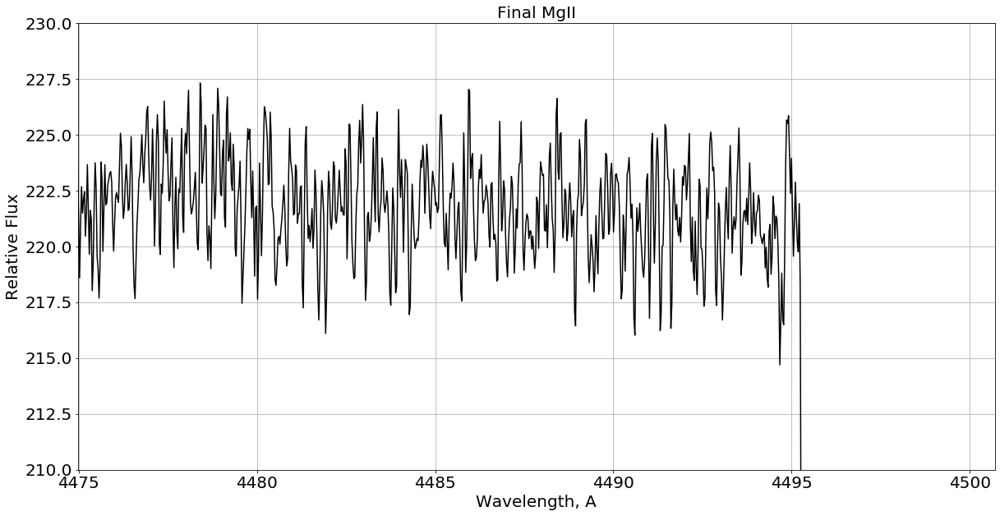

In [72]:

plt.rc('xtick',c='k')
plt.rc('ytick',c='k')
plt.figure(figsize=(20,10))
plt.title('Final MgII',fontsize=20)
plt.plot(resample_grid,cummulative,c='k')
#plt.plot(resample_gridGraces,cummulativeGracesCorrected)
#plt.plot(resample_grid, cummulative/np.median(cummulative))
plt.xlim(4474.97437641, 4500.70285409)
plt.xticks(fontsize=20)
plt.ylim(210,230)
plt.yticks(fontsize=20)
plt.xlabel('Wavelength, A',fontsize=20)
plt.ylabel('Relative Flux',fontsize=20)
plt.grid()
plt.savefig('GD1400_MgII_Master.pdf')
plt.show()



In [105]:
path = '/home/nwal/Desktop/GD1400/reflexFin/'
fluxes = []
wavels = []
count = 0
with open(path+'blues') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        flx = flx/np.median(flx)
        fluxes.append(flx)#[25515:26431])
        wavels.append(wvl)#[25515:26431])
        count = count+1
path = '/home/nwal/Desktop/GD1400/reflexFin/'
dates2 = []
with open(path+'blues') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()



In [106]:
model = np.array([54.25640818, 56.35952362, 62.20031293, 61.2206126 , 22.04841691,
       24.10582841, 33.34020562, 36.10985002, 16.91358673, 17.84262664,
       52.09237856, 49.60621251, 25.35319581, 23.20811117, 40.05193304,
       42.87160273,
       50.37601624, 52.82800467, 55.11330237, 57.14646818, 36.88764516,
       34.11224261, 45.51942318, 48.18928433, 61.30492373, 60.0362804 ,
       42.99912368, 40.18162378])
bary = np.array([25.342287187845695, 25.324802622778215, 25.226114727913906, 25.20832603476894, 25.01811236294185, 24.99989228581482, 23.8584050259424, 23.838551477190855, 23.512439009649096, 23.49220987681981, 23.36240026097529, 23.34432399444072, 21.82082371480919, 21.802483214711007, 21.61368572773136, 21.59560467267822, 18.20046245302884, 18.17948585085599, 18.158482948010302, 18.1379753725614, 15.500016456302813, 15.489895692206467, 15.084480282784687, 15.069924147018494, 14.800953417905236, 14.790509828242206, 14.686927704603335, 14.670181021391208])

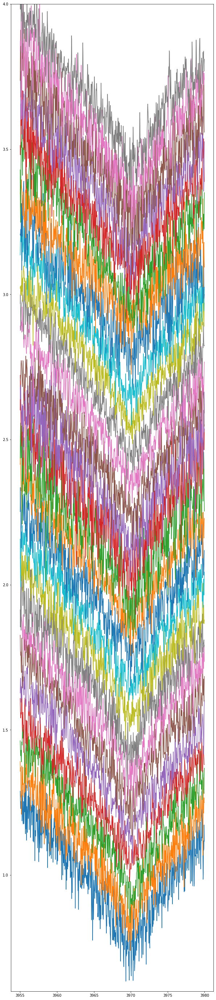

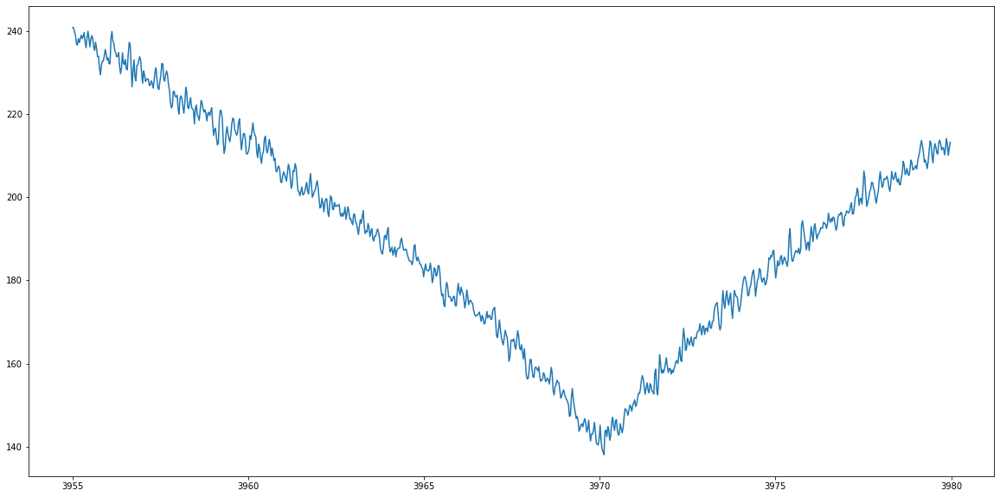

In [107]:
velocitiesCP = model - bary 
velocitiesCP = -velocitiesCP#-np.array(barV)
#print(len(velocitiesCP))
adjFlux = []
adjWvl = []

for count, value in enumerate(wavels):
    newF, newW = dopplerShift(value, fluxes[count],velocitiesCP[count],edgeHandling='fillValue',fillValue=1)
    adjFlux.append(newF)
    adjWvl.append(newW)
    
fluxAdj = []
for count, value in enumerate(wavels):
    input_spectra = Spectrum1D(flux=adjFlux[count]* u.mJy,spectral_axis=value*u.Angstrom)
    resample_grid = wavels[0][25515:26431]*u.Angstrom
    fluxc_resample = FluxConservingResampler()
    output_spectrum1D = fluxc_resample(input_spectra, resample_grid)
    fluxAdj.append(np.nan_to_num(output_spectrum1D.flux, copy=False, nan=0.0))

plt.figure(figsize=(10,50))
fluxAdjWeighted = []
cummulative = np.zeros_like(fluxAdj[0])
cummulative = cummulative.value
cc = 0
for el in fluxAdj:
    plt.plot(resample_grid, el/np.median(el)+cc*0.1)
    plt.ylim(0.6,4.)
    stedies = 1/np.std(el/np.median(el))
    fluxAdjWeighted.append(stedies*el/np.median(el))
    cummulative = cummulative+stedies*el.value/np.median(el.value)
    cc = cc + 1
    #plt.show()
plt.show()
plt.figure(figsize=(20,10))
plt.plot(resample_grid, cummulative)

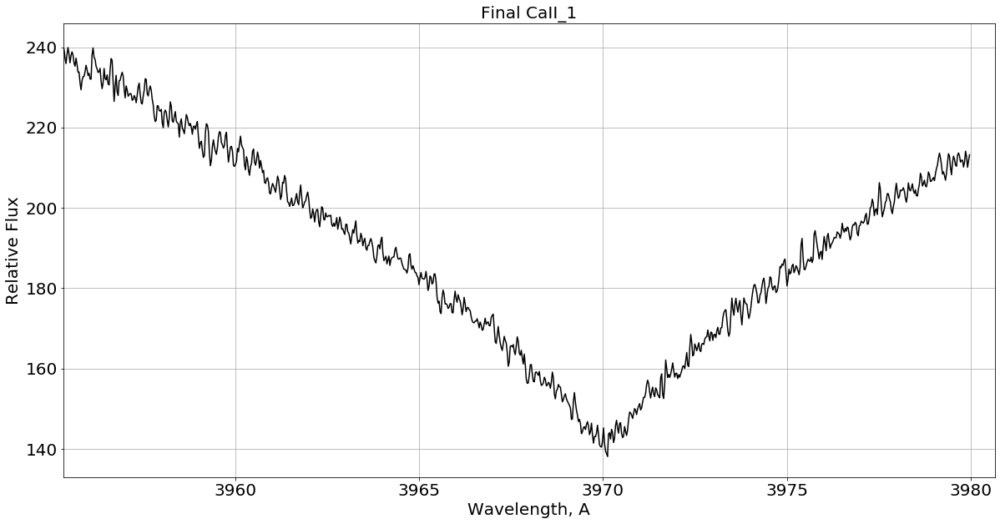

In [108]:

plt.rc('xtick',c='k')
plt.rc('ytick',c='k')
plt.figure(figsize=(20,10))
plt.title('Final CaII_1',fontsize=20)
plt.plot(resample_grid,cummulative,c='k')
#plt.plot(resample_gridGraces,cummulativeGracesCorrected)
#plt.plot(resample_grid, cummulative/np.median(cummulative))
plt.xlim(3955.3121, 3980.6584)
plt.xticks(fontsize=20)
#plt.ylim(210,230)
plt.yticks(fontsize=20)
plt.xlabel('Wavelength, A',fontsize=20)
plt.ylabel('Relative Flux',fontsize=20)
plt.grid()
plt.savefig('GD1400_CaII_1_Master.pdf')
plt.show()



In [118]:
path = '/home/nwal/Desktop/GD1400/reflexFin/'
fluxes = []
wavels = []
count = 0
with open(path+'blues') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        flx = flx/np.median(flx)
        fluxes.append(flx)#[25515:26431])
        wavels.append(wvl)#[25515:26431])
        count = count+1
path = '/home/nwal/Desktop/GD1400/reflexFin/'
dates2 = []
with open(path+'blues') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()

In [119]:
model = np.array([54.25640818, 56.35952362, 62.20031293, 61.2206126 , 22.04841691,
       24.10582841, 33.34020562, 36.10985002, 16.91358673, 17.84262664,
       52.09237856, 49.60621251, 25.35319581, 23.20811117, 40.05193304,
       42.87160273,
       50.37601624, 52.82800467, 55.11330237, 57.14646818, 36.88764516,
       34.11224261, 45.51942318, 48.18928433, 61.30492373, 60.0362804 ,
       42.99912368, 40.18162378])
bary = np.array([25.342287187845695, 25.324802622778215, 25.226114727913906, 25.20832603476894, 25.01811236294185, 24.99989228581482, 23.8584050259424, 23.838551477190855, 23.512439009649096, 23.49220987681981, 23.36240026097529, 23.34432399444072, 21.82082371480919, 21.802483214711007, 21.61368572773136, 21.59560467267822, 18.20046245302884, 18.17948585085599, 18.158482948010302, 18.1379753725614, 15.500016456302813, 15.489895692206467, 15.084480282784687, 15.069924147018494, 14.800953417905236, 14.790509828242206, 14.686927704603335, 14.670181021391208])

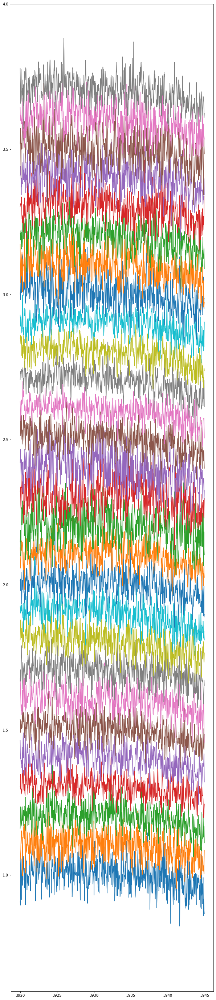

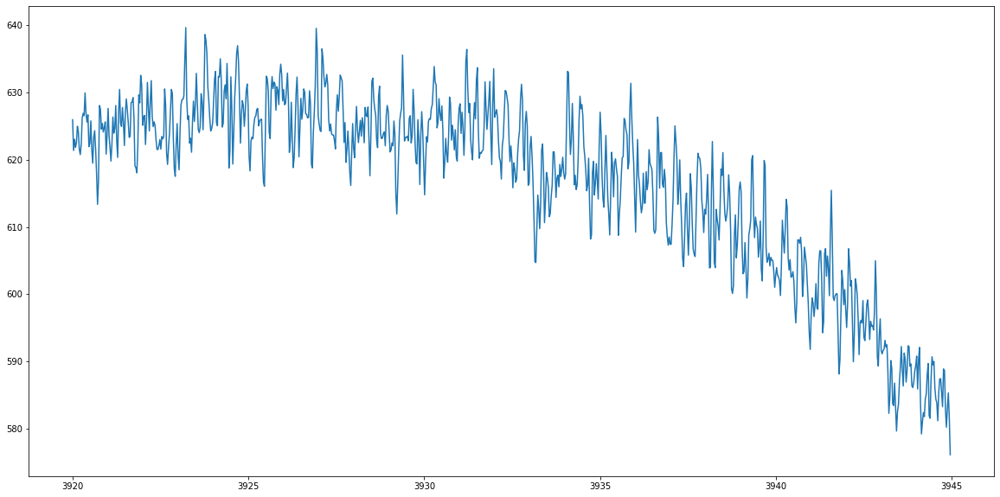

In [120]:
velocitiesCP = model - bary 
velocitiesCP = -velocitiesCP#-np.array(barV)
#print(len(velocitiesCP))
adjFlux = []
adjWvl = []

for count, value in enumerate(wavels):
    newF, newW = dopplerShift(value, fluxes[count],velocitiesCP[count],edgeHandling='fillValue',fillValue=1)
    adjFlux.append(newF)
    adjWvl.append(newW)
    
fluxAdj = []
for count, value in enumerate(wavels):
    input_spectra = Spectrum1D(flux=adjFlux[count]* u.mJy,spectral_axis=value*u.Angstrom)
    resample_grid = wavels[0][24232:25148]*u.Angstrom
    fluxc_resample = FluxConservingResampler()
    output_spectrum1D = fluxc_resample(input_spectra, resample_grid)
    fluxAdj.append(np.nan_to_num(output_spectrum1D.flux, copy=False, nan=0.0))

plt.figure(figsize=(10,50))
fluxAdjWeighted = []
cummulative = np.zeros_like(fluxAdj[0])
cummulative = cummulative.value
cc = 0
for el in fluxAdj:
    plt.plot(resample_grid, el/np.median(el)+cc*0.1)
    plt.ylim(0.6,4.)
    stedies = 1/np.std(el/np.median(el))
    fluxAdjWeighted.append(stedies*el/np.median(el))
    cummulative = cummulative+stedies*el.value/np.median(el.value)
    cc = cc + 1
    #plt.show()
plt.show()
plt.figure(figsize=(20,10))
plt.plot(resample_grid, cummulative)

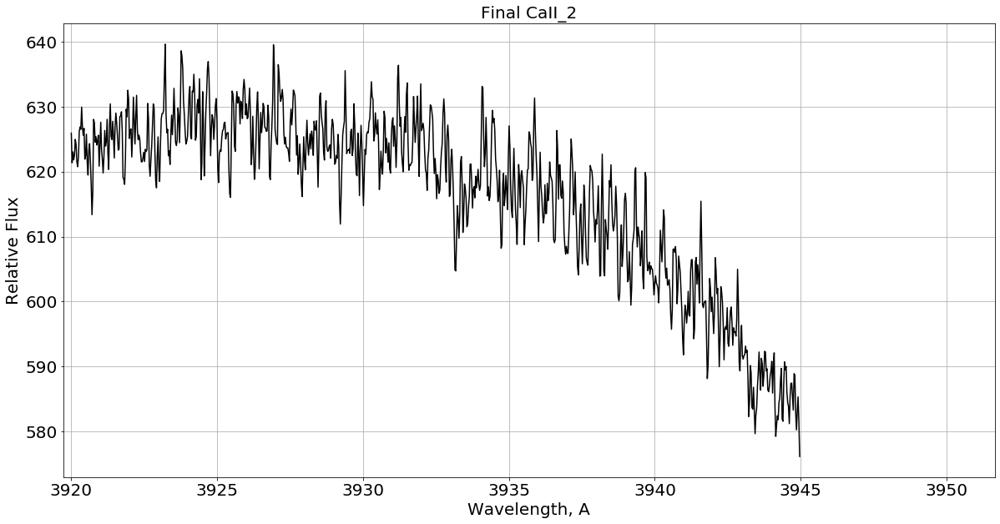

In [121]:

plt.rc('xtick',c='k')
plt.rc('ytick',c='k')
plt.figure(figsize=(20,10))
plt.title('Final CaII_2',fontsize=20)
plt.plot(resample_grid,cummulative,c='k')
#plt.plot(resample_gridGraces,cummulativeGracesCorrected)
#plt.plot(resample_grid, cummulative/np.median(cummulative))
plt.xlim(3919.7203, 3951.6523)
plt.xticks(fontsize=20)
#plt.ylim(210,230)
plt.yticks(fontsize=20)
plt.xlabel('Wavelength, A',fontsize=20)
plt.ylabel('Relative Flux',fontsize=20)
plt.grid()
plt.savefig('GD1400_CaII_2_Master.pdf')
plt.show()



In [130]:
path = '/home/nwal/Desktop/GD1400/reflexFin/'
fluxes = []
wavels = []
count = 0
with open(path+'blues') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        wvl, flx = pyasl.read1dFitsSpec(line)
        flx = flx/np.median(flx)
        fluxes.append(flx)#[25515:26431])
        wavels.append(wvl)#[25515:26431])
        count = count+1
path = '/home/nwal/Desktop/GD1400/reflexFin/'
dates2 = []
with open(path+'blues') as file:
    for line in file:
        line = line.strip('\n')
        line = path+line
        hdul = fits.open(line)
        dates2.append(hdul[0].header['MJD-OBS'])
        hdul.close()

In [131]:
model = np.array([54.25640818, 56.35952362, 62.20031293, 61.2206126 , 22.04841691,
       24.10582841, 33.34020562, 36.10985002, 16.91358673, 17.84262664,
       52.09237856, 49.60621251, 25.35319581, 23.20811117, 40.05193304,
       42.87160273,
       50.37601624, 52.82800467, 55.11330237, 57.14646818, 36.88764516,
       34.11224261, 45.51942318, 48.18928433, 61.30492373, 60.0362804 ,
       42.99912368, 40.18162378])
bary = np.array([25.342287187845695, 25.324802622778215, 25.226114727913906, 25.20832603476894, 25.01811236294185, 24.99989228581482, 23.8584050259424, 23.838551477190855, 23.512439009649096, 23.49220987681981, 23.36240026097529, 23.34432399444072, 21.82082371480919, 21.802483214711007, 21.61368572773136, 21.59560467267822, 18.20046245302884, 18.17948585085599, 18.158482948010302, 18.1379753725614, 15.500016456302813, 15.489895692206467, 15.084480282784687, 15.069924147018494, 14.800953417905236, 14.790509828242206, 14.686927704603335, 14.670181021391208])

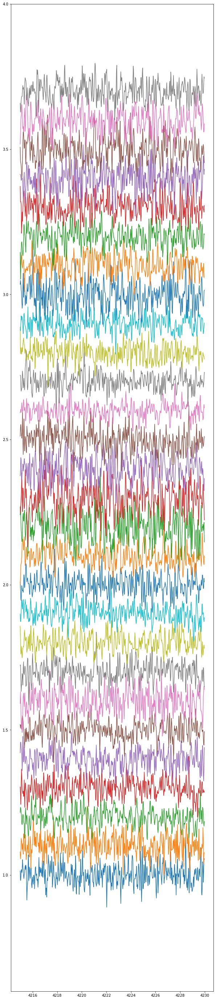

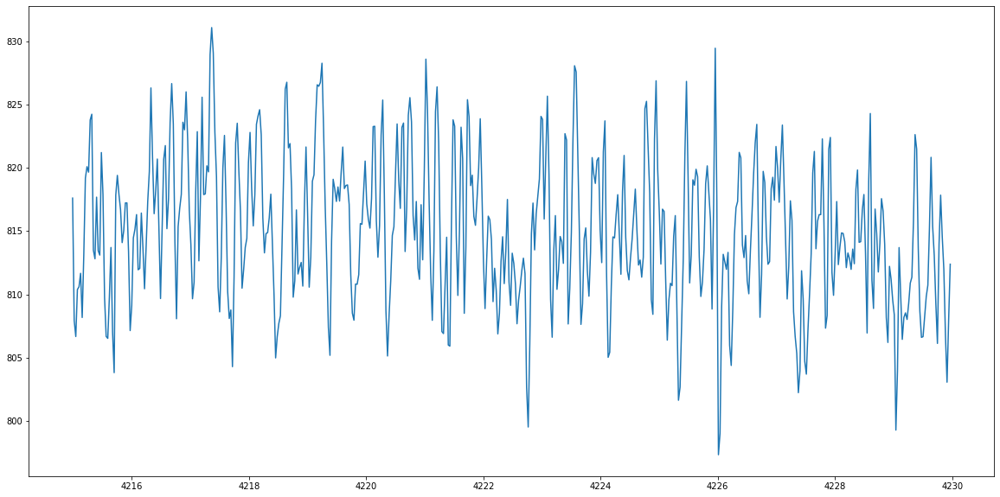

In [132]:
velocitiesCP = model - bary 
velocitiesCP = -velocitiesCP#-np.array(barV)
#print(len(velocitiesCP))
adjFlux = []
adjWvl = []

for count, value in enumerate(wavels):
    newF, newW = dopplerShift(value, fluxes[count],velocitiesCP[count],edgeHandling='fillValue',fillValue=1)
    adjFlux.append(newF)
    adjWvl.append(newW)
    
fluxAdj = []
for count, value in enumerate(wavels):
    input_spectra = Spectrum1D(flux=adjFlux[count]* u.mJy,spectral_axis=value*u.Angstrom)
    resample_grid = wavels[0][35043:35593]*u.Angstrom
    fluxc_resample = FluxConservingResampler()
    output_spectrum1D = fluxc_resample(input_spectra, resample_grid)
    fluxAdj.append(np.nan_to_num(output_spectrum1D.flux, copy=False, nan=0.0))

plt.figure(figsize=(10,50))
fluxAdjWeighted = []
cummulative = np.zeros_like(fluxAdj[0])
cummulative = cummulative.value
cc = 0
for el in fluxAdj:
    plt.plot(resample_grid, el/np.median(el)+cc*0.1)
    plt.ylim(0.6,4.)
    stedies = 1/np.std(el/np.median(el))
    fluxAdjWeighted.append(stedies*el/np.median(el))
    cummulative = cummulative+stedies*el.value/np.median(el.value)
    cc = cc + 1
    #plt.show()
plt.show()
plt.figure(figsize=(20,10))
plt.plot(resample_grid, cummulative)

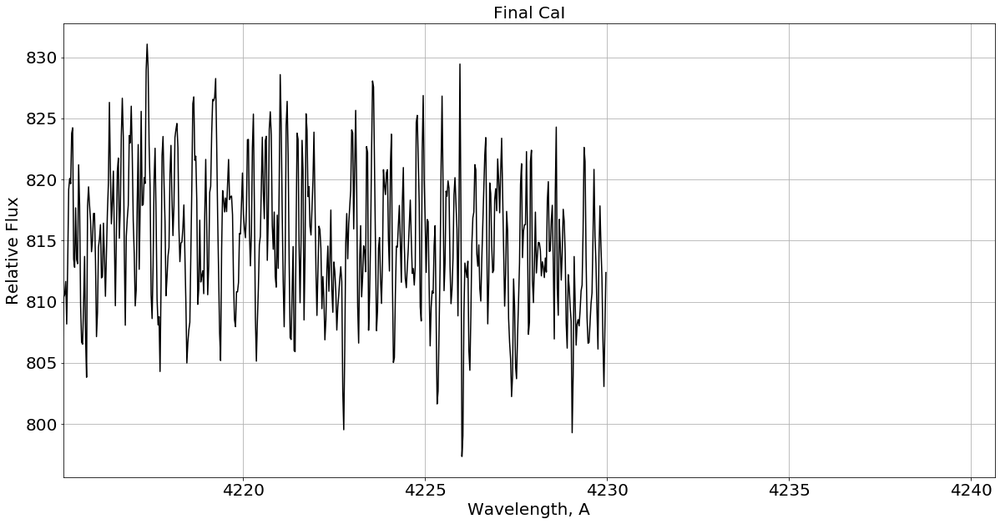

In [133]:

plt.rc('xtick',c='k')
plt.rc('ytick',c='k')
plt.figure(figsize=(20,10))
plt.title('Final CaI',fontsize=20)
plt.plot(resample_grid,cummulative,c='k')
#plt.plot(resample_gridGraces,cummulativeGracesCorrected)
#plt.plot(resample_grid, cummulative/np.median(cummulative))

plt.xlim(4215.0551, 4240.6518)
plt.xticks(fontsize=20)
#plt.ylim(210,230)
plt.yticks(fontsize=20)
plt.xlabel('Wavelength, A',fontsize=20)
plt.ylabel('Relative Flux',fontsize=20)
plt.grid()
plt.savefig('GD1400_CaI_Master.pdf')
plt.show()

